In [178]:
## Importing libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
pd.set_option('display.max_columns', None)
from sklearn.feature_selection import VarianceThreshold
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold, KFold, GridSearchCV, learning_curve
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.feature_selection import chi2
from sklearn.feature_selection import SelectKBest, mutual_info_classif
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report , roc_auc_score, roc_curve, auc , precision_recall_curve, confusion_matrix, accuracy_score, f1_score, recall_score, r2_score, precision_score, classification_report, root_mean_squared_error, mean_squared_error
import joblib
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier, XGBRegressor
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression, Ridge, Lasso
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from imblearn.over_sampling import SMOTE, ADASYN
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [179]:
df_train=pd.read_csv("C:/Users/Asus/Downloads/Backorder_Training_Dataset_v2.csv")
df_test=pd.read_csv("C:/Users/Asus/Downloads/Backorder_Test_Dataset_v2.csv")

C:\Users\Asus\AppData\Local\Temp\ipykernel_26240\2669923111.py:1: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df_train=pd.read_csv("C:/Users/Asus/Downloads/Backorder_Training_Dataset_v2.csv")
C:\Users\Asus\AppData\Local\Temp\ipykernel_26240\2669923111.py:2: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df_test=pd.read_csv("C:/Users/Asus/Downloads/Backorder_Test_Dataset_v2.csv")


In [180]:
df_train.head()

,sku,national_inv,lead_time,in_transit_qty,forecast_3_month,forecast_6_month,forecast_9_month,sales_1_month,sales_3_month,sales_6_month,sales_9_month,min_bank,potential_issue,pieces_past_due,perf_6_month_avg,perf_12_month_avg,local_bo_qty,deck_risk,oe_constraint,ppap_risk,stop_auto_buy,rev_stop,went_on_backorder
0,1026827,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,No,0.0,-99.00,-99.00,0.0,No,No,No,Yes,No,No
1,1043384,2.0,9.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,No,0.0,0.99,0.99,0.0,No,No,No,Yes,No,No
2,1043696,2.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,No,0.0,-99.00,-99.00,0.0,Yes,No,No,Yes,No,No
3,1043852,7.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,No,0.0,0.10,0.13,0.0,No,No,No,Yes,No,No
4,1044048,8.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,2.0,No,0.0,-99.00,-99.00,0.0,Yes,No,No,Yes,No,No


In [181]:
df_train.shape

(1687861, 23)

In [182]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1687861 entries, 0 to 1687860
Data columns (total 23 columns):
 #   Column             Non-Null Count    Dtype  
---  ------             --------------    -----  
 0   sku                1687861 non-null  object 
 1   national_inv       1687860 non-null  float64
 2   lead_time          1586967 non-null  float64
 3   in_transit_qty     1687860 non-null  float64
 4   forecast_3_month   1687860 non-null  float64
 5   forecast_6_month   1687860 non-null  float64
 6   forecast_9_month   1687860 non-null  float64
 7   sales_1_month      1687860 non-null  float64
 8   sales_3_month      1687860 non-null  float64
 9   sales_6_month      1687860 non-null  float64
 10  sales_9_month      1687860 non-null  float64
 11  min_bank           1687860 non-null  float64
 12  potential_issue    1687860 non-null  object 
 13  pieces_past_due    1687860 non-null  float64
 14  perf_6_month_avg   1687860 non-null  float64
 15  perf_12_month_avg  1687860 non-n

In [183]:
## Finding null values
df_train.isnull().sum()

sku                       0
national_inv              1
lead_time            100894
in_transit_qty            1
forecast_3_month          1
forecast_6_month          1
forecast_9_month          1
sales_1_month             1
sales_3_month             1
sales_6_month             1
sales_9_month             1
min_bank                  1
potential_issue           1
pieces_past_due           1
perf_6_month_avg          1
perf_12_month_avg         1
local_bo_qty              1
deck_risk                 1
oe_constraint             1
ppap_risk                 1
stop_auto_buy             1
rev_stop                  1
went_on_backorder         1
dtype: int64

In [184]:
## Identifying and eliminating the row with all NaN values
null_index = df_train[df_train['national_inv'].isnull()].index.tolist()
df_train = df_train.drop(null_index)

In [185]:
df_train.isnull().sum()

sku                       0
national_inv              0
lead_time            100893
in_transit_qty            0
forecast_3_month          0
forecast_6_month          0
forecast_9_month          0
sales_1_month             0
sales_3_month             0
sales_6_month             0
sales_9_month             0
min_bank                  0
potential_issue           0
pieces_past_due           0
perf_6_month_avg          0
perf_12_month_avg         0
local_bo_qty              0
deck_risk                 0
oe_constraint             0
ppap_risk                 0
stop_auto_buy             0
rev_stop                  0
went_on_backorder         0
dtype: int64

In [186]:
df_train['lead_time'] = df_train['lead_time'].fillna(df_train['lead_time'].median())

In [187]:
df_train.isnull().sum()

sku                  0
national_inv         0
lead_time            0
in_transit_qty       0
forecast_3_month     0
forecast_6_month     0
forecast_9_month     0
sales_1_month        0
sales_3_month        0
sales_6_month        0
sales_9_month        0
min_bank             0
potential_issue      0
pieces_past_due      0
perf_6_month_avg     0
perf_12_month_avg    0
local_bo_qty         0
deck_risk            0
oe_constraint        0
ppap_risk            0
stop_auto_buy        0
rev_stop             0
went_on_backorder    0
dtype: int64

In [188]:
df_train['perf_6_month_avg'] = df_train['perf_6_month_avg'].replace(-99.00,0.99)
df_train['perf_12_month_avg'] = df_train['perf_12_month_avg'].replace(-99.00,0.99)

In [189]:
## Identifying the numerical and categorical features
numerical_features =[feature for feature in df_train.columns if df_train[feature].dtype!='O']
categorical_features =[feature for feature in df_train.columns if df_train[feature].dtype=='O']

In [190]:
df_train[numerical_features].head()

,national_inv,lead_time,in_transit_qty,forecast_3_month,forecast_6_month,forecast_9_month,sales_1_month,sales_3_month,sales_6_month,sales_9_month,min_bank,pieces_past_due,perf_6_month_avg,perf_12_month_avg,local_bo_qty
0,0.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.99,0.99,0.0
1,2.0,9.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.99,0.99,0.0
2,2.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.99,0.99,0.0
3,7.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.10,0.13,0.0
4,8.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,2.0,0.0,0.99,0.99,0.0


In [191]:
df_train[categorical_features].head()

,sku,potential_issue,deck_risk,oe_constraint,ppap_risk,stop_auto_buy,rev_stop,went_on_backorder
0,1026827,No,No,No,No,Yes,No,No
1,1043384,No,No,No,No,Yes,No,No
2,1043696,No,Yes,No,No,Yes,No,No
3,1043852,No,No,No,No,Yes,No,No
4,1044048,No,Yes,No,No,Yes,No,No


In [192]:
df_train.drop(['sku'], axis=1, inplace=True)

In [193]:
## Mapping No as 1 and Yes as 0
mapping = {'Yes': 0, 'No': 1}
mapping_target = {'Yes':1, 'No':0}
df_train['potential_issue'] = df_train['potential_issue'].map(mapping)
df_train['deck_risk'] = df_train['deck_risk'].map(mapping)
df_train['oe_constraint'] = df_train['oe_constraint'].map(mapping)
df_train['ppap_risk'] = df_train['ppap_risk'].map(mapping)
df_train['stop_auto_buy'] = df_train['stop_auto_buy'].map(mapping)
df_train['rev_stop'] = df_train['rev_stop'].map(mapping)
df_train['went_on_backorder'] = df_train['went_on_backorder'].map(mapping_target)

In [194]:
df_train

,national_inv,lead_time,in_transit_qty,forecast_3_month,forecast_6_month,forecast_9_month,sales_1_month,sales_3_month,sales_6_month,sales_9_month,min_bank,potential_issue,pieces_past_due,perf_6_month_avg,perf_12_month_avg,local_bo_qty,deck_risk,oe_constraint,ppap_risk,stop_auto_buy,rev_stop,went_on_backorder
0,0.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0.0,0.99,0.99,0.0,1,1,1,0,1,0
1,2.0,9.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0.0,0.99,0.99,0.0,1,1,1,0,1,0
2,2.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0.0,0.99,0.99,0.0,0,1,1,0,1,0
3,7.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1,0.0,0.10,0.13,0.0,1,1,1,0,1,0
4,8.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,2.0,1,0.0,0.99,0.99,0.0,0,1,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1687855,0.0,2.0,0.0,10.0,10.0,10.0,0.0,5.0,7.0,7.0,0.0,1,0.0,0.69,0.69,5.0,0,1,1,0,1,0
1687856,-1.0,8.0,0.0,5.0,7.0,9.0,1.0,3.0,3.0,8.0,0.0,1,0.0,0.99,0.99,1.0,1,1,1,0,1,0
1687857,-1.0,9.0,0.0,7.0,9.0,11.0,0.0,8.0,11.0,12.0,0.0,1,0.0,0.86,0.84,1.0,0,1,1,1,1,1
1687858,62.0,9.0,16.0,39.0,87.0,126.0,35.0,63.0,153.0,205.0,12.0,1,0.0,0.86,0.84,6.0,1,1,1,0,1,0


In [195]:
## Identifying discrete and continous features
discrete_features = [feature for feature in numerical_features if len(df_train[feature].unique())<25]
continious_features = [feature for feature in numerical_features if feature not in discrete_features]
print("Discrete features:", discrete_features)
print("Continious features:", continious_features)

Discrete features: []
Continious features: ['national_inv', 'lead_time', 'in_transit_qty', 'forecast_3_month', 'forecast_6_month', 'forecast_9_month', 'sales_1_month', 'sales_3_month', 'sales_6_month', 'sales_9_month', 'min_bank', 'pieces_past_due', 'perf_6_month_avg', 'perf_12_month_avg', 'local_bo_qty']


In [196]:
for feature in numerical_features:
  print(df_train[feature].agg(['min', 'max']))
  print("\n")

min      -27256.0
max    12334404.0
Name: national_inv, dtype: float64


min     0.0
max    52.0
Name: lead_time, dtype: float64


min         0.0
max    489408.0
Name: in_transit_qty, dtype: float64


min          0.0
max    1427612.0
Name: forecast_3_month, dtype: float64


min          0.0
max    2461360.0
Name: forecast_6_month, dtype: float64


min          0.0
max    3777304.0
Name: forecast_9_month, dtype: float64


min         0.0
max    741774.0
Name: sales_1_month, dtype: float64


min          0.0
max    1105478.0
Name: sales_3_month, dtype: float64


min          0.0
max    2146625.0
Name: sales_6_month, dtype: float64


min          0.0
max    3205172.0
Name: sales_9_month, dtype: float64


min         0.0
max    313319.0
Name: min_bank, dtype: float64


min         0.0
max    146496.0
Name: pieces_past_due, dtype: float64


min    0.0
max    1.0
Name: perf_6_month_avg, dtype: float64


min    0.0
max    1.0
Name: perf_12_month_avg, dtype: float64


min        0.0
max    1

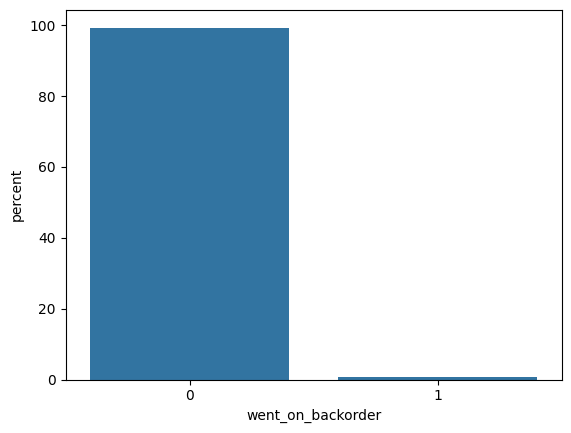

In [197]:
## Countplot for backorder
## 0 - No backorder
## 1 - went on backorder
sns.countplot(x='went_on_backorder', data=df_train, stat='percent')
plt.show()

Only a few percentage of the products have gone for a backorder

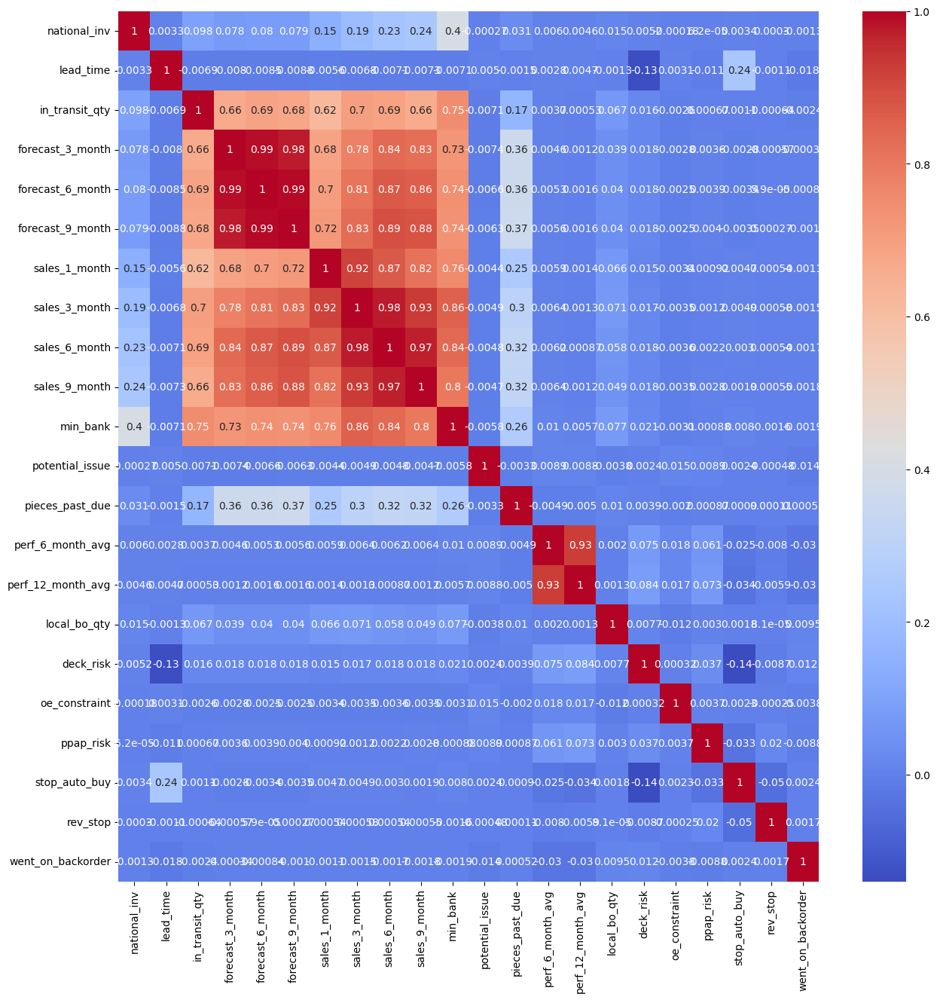

In [198]:
## Plotting a heatmap to check the correlation
plt.figure(figsize=(15,15))
sns.heatmap(df_train.corr(), annot=True, cmap="coolwarm")
plt.show()

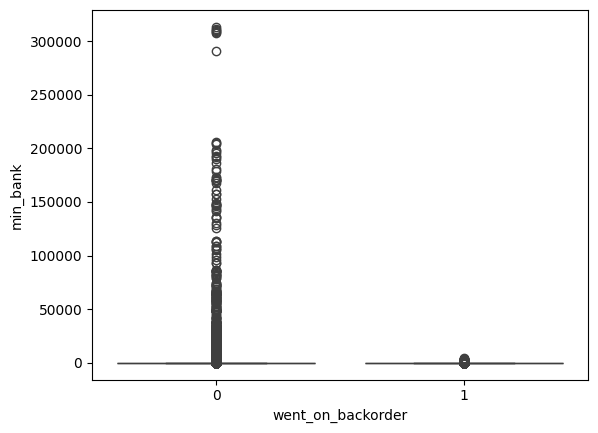

In [199]:
## Plotting relationship between min_bank and went_on_backorder
sns.boxplot(x = 'went_on_backorder', y = 'min_bank', data = df_train)
plt.show()

 The boxplot shows that having a lower minimum recommended amount to stock is
 associated with an increased likelihood of the product going on backorder

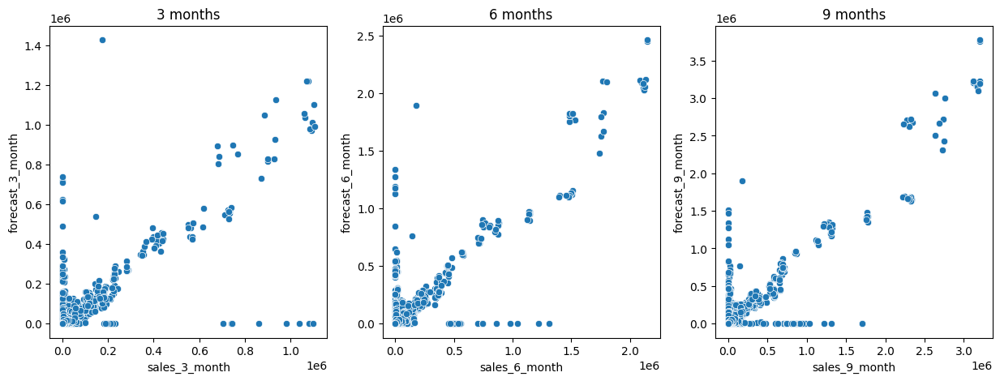

In [67]:
## Plotting relationship between sales and forecast
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
sns.scatterplot(x="sales_3_month", y="forecast_3_month", data=df_train, ax=axes[0])
axes[0].set_title("3 months")
sns.scatterplot(x="sales_6_month", y="forecast_6_month", data=df_train, ax=axes[1])
axes[1].set_title("6 months")
sns.scatterplot(x="sales_9_month", y="forecast_9_month", data=df_train, ax=axes[2])
axes[2].set_title("9 months")
plt.show()

The above 3 graphs show a positive correlation between actual sales and forecasted sales which indicates that the forecasting model effectively captures the sales trend.

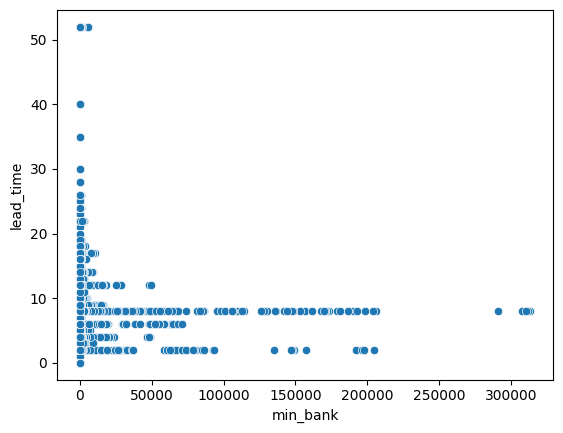

In [200]:
## Plotting relationship between min_bank and lead_time
sns.scatterplot(x="min_bank", y="lead_time", data=df_train)
plt.show()

Higher concentration of points at the bottom indicate that most of the products have lower min_bank and lead_time.

However, there are some products where the lead_time is 20-50 days and the min_bank is relatively low.

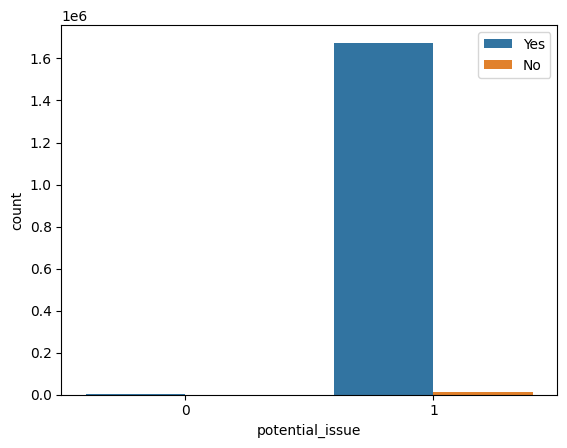

In [201]:
## Plotting relationship between potential_issue and went_on_backorder
sns.countplot(x="potential_issue", hue="went_on_backorder", data=df_train)
plt.legend(['Yes','No'])
plt.show()

The majority of the products which have potential_issue as 1, went on backorder

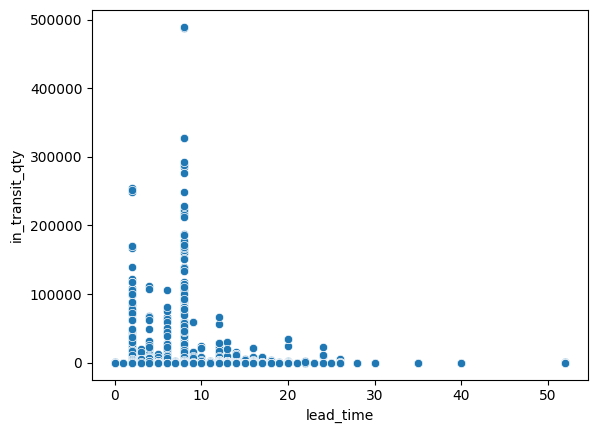

In [202]:
## Plotting relationship between lead_time and in_transit_qty
sns.scatterplot(x="lead_time", y="in_transit_qty", data=df_train)
plt.show()

Most of the products have smaller lead_time and many in transit quantities

As lead_time increases beyond 10 days, the quantity of products in transit generally decreases.

Few products having long lead times i.e (> 20 days), have lower quantities in transit.




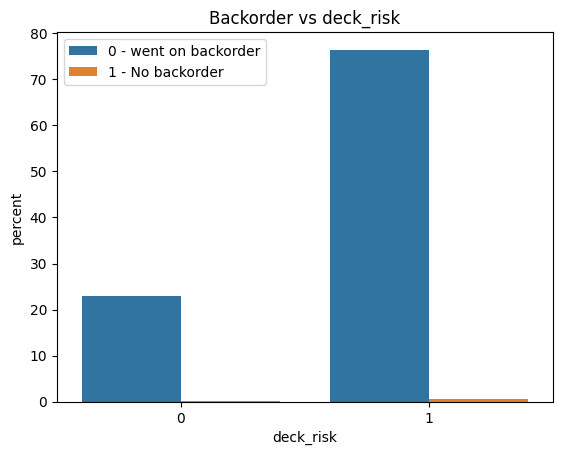

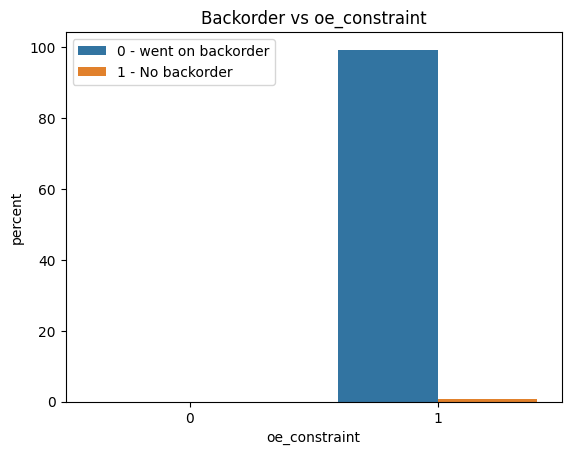

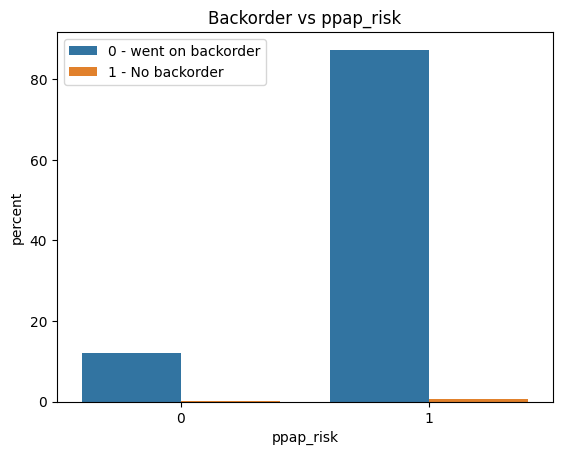

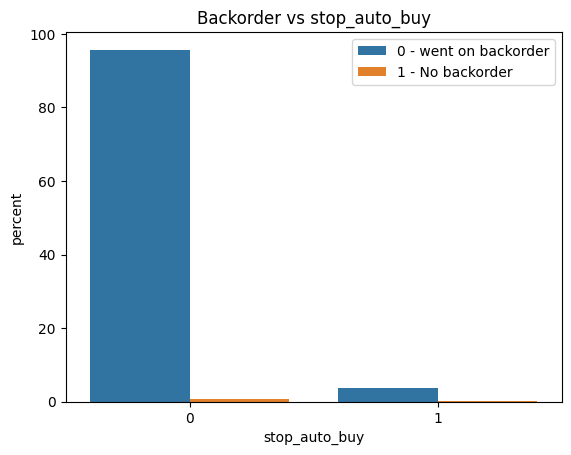

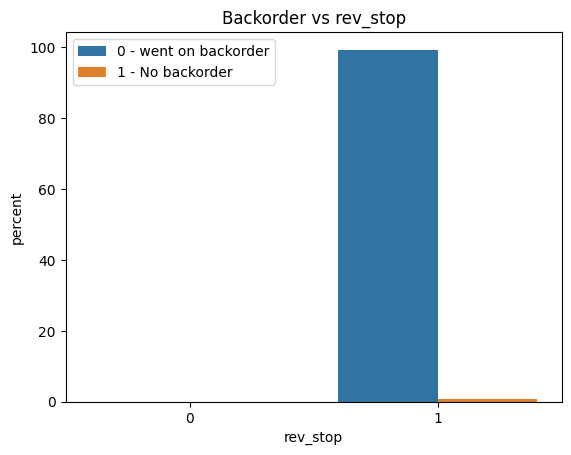

In [203]:
## Plotting relationship between went_on_backorder and all risk flags
for feature in ['deck_risk', 'oe_constraint', 'ppap_risk', 'stop_auto_buy', 'rev_stop']:
  sns.countplot(x=feature, hue='went_on_backorder', data=df_train, stat='percent')
  plt.title(f"Backorder vs "+ str(feature))
  plt.legend(["0 - went on backorder","1 - No backorder"])
  plt.show()

**Backorder vs deck_risk (1st graph)** - If we just look at the products which went on backorder, the ones without deck risk are more likely to go on backorder

**Backorder vs oe_constraint (2nd graph)** - The results are similar to deck_risk. Also, there are hardly any products where the oe_constraint is 0.


**Backorder vs ppap_risk (3rd graph)** - Here, there is an increased chance of the products going on backorder when the ppap_risk value is 1.


**Backorder vs stop_auto_buy (4th graph)** - Majority of products that went on backorder did not have the stop_auto_buy flag as 1.

**Backorder vs rev_stop (5th graph)** - Similar to other risk flags, rev_stop being set to 1 indicates a high probability of the product going on backorder.

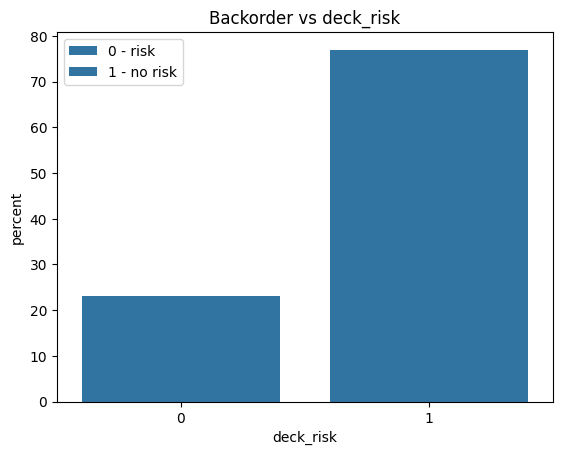

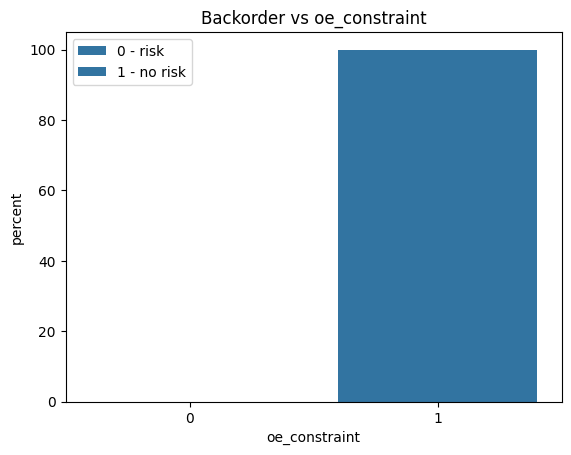

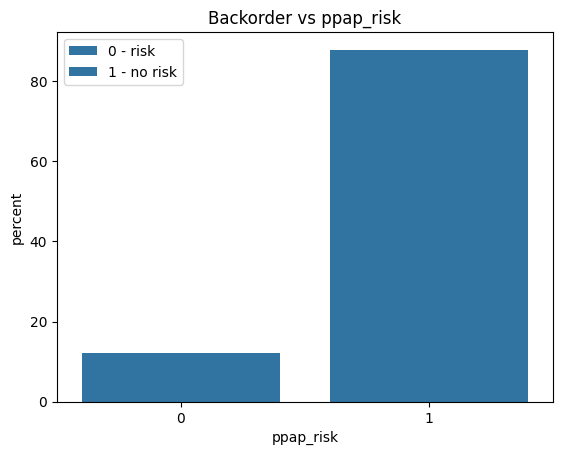

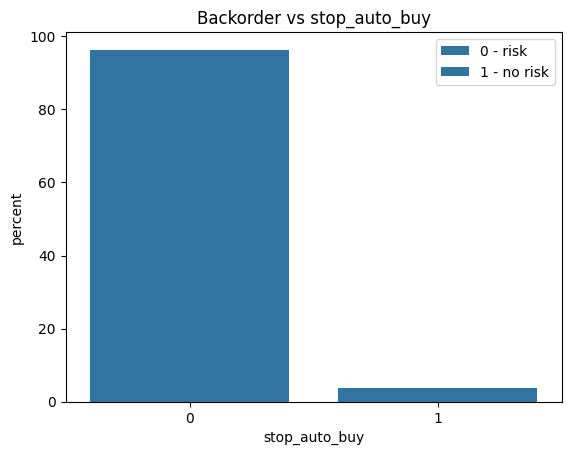

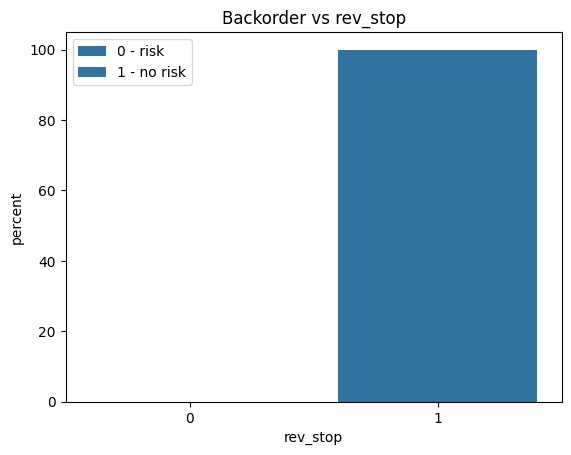

In [204]:
## A closer look at the impact of risk flags on the products that went on backorder
for feature in ['deck_risk', 'oe_constraint', 'ppap_risk', 'stop_auto_buy', 'rev_stop']:
  sns.countplot(x=feature, hue='went_on_backorder', data=df_train[df_train['went_on_backorder'] == 0], stat='percent')
  plt.title(f"Backorder vs "+ str(feature))
  plt.legend(["0 - risk","1 - no risk"])
  plt.show()

## Scaling and normalizing the data

In [19]:
## Creating copies of the dataset
scaled_data = df_train.copy()
norm_data = df_train.copy()

In [20]:
## Scaling the data
scaler=StandardScaler()
features=['national_inv', 'lead_time', 'in_transit_qty', 'forecast_3_month',
       'forecast_6_month', 'forecast_9_month', 'sales_1_month',
       'sales_3_month', 'sales_6_month', 'sales_9_month', 'min_bank',
       'potential_issue', 'pieces_past_due', 'perf_6_month_avg',
       'perf_12_month_avg', 'local_bo_qty', 'deck_risk', 'oe_constraint',
       'ppap_risk', 'stop_auto_buy', 'rev_stop']
target=['went_on_backorder']
scaled_data[features]=scaler.fit_transform(scaled_data[features])

## Normalizing the data
from sklearn.preprocessing import MinMaxScaler
norm=MinMaxScaler()
norm=norm.fit_transform(norm_data)

In [21]:
scaled_data.head()

,national_inv,lead_time,in_transit_qty,forecast_3_month,forecast_6_month,forecast_9_month,sales_1_month,sales_3_month,sales_6_month,sales_9_month,min_bank,potential_issue,pieces_past_due,perf_6_month_avg,perf_12_month_avg,local_bo_qty,deck_risk,oe_constraint,ppap_risk,stop_auto_buy,rev_stop,went_on_backorder
0,-0.016752,0.017553,-0.032808,-0.035436,-0.03522,-0.035216,-0.029004,-0.033708,-0.035548,-0.035399,-0.042050,0.023187,-0.008659,0.817978,0.863898,-0.018577,0.545873,0.012049,0.37061,-0.193779,0.020815,0
1,-0.016684,0.163710,-0.032808,-0.035436,-0.03522,-0.035216,-0.029004,-0.033708,-0.035548,-0.035399,-0.042050,0.023187,-0.008659,0.817978,0.863898,-0.018577,0.545873,0.012049,0.37061,-0.193779,0.020815,0
2,-0.016684,0.017553,-0.032808,-0.035436,-0.03522,-0.035216,-0.029004,-0.033708,-0.035548,-0.035399,-0.042050,0.023187,-0.008659,0.817978,0.863898,-0.018577,-1.831928,0.012049,0.37061,-0.193779,0.020815,0
3,-0.016516,0.017553,-0.032808,-0.035436,-0.03522,-0.035216,-0.029004,-0.033708,-0.035548,-0.035399,-0.041253,0.023187,-0.008659,-2.979780,-2.895603,-0.018577,0.545873,0.012049,0.37061,-0.193779,0.020815,0
4,-0.016482,0.017553,-0.032808,-0.035436,-0.03522,-0.035216,-0.029004,-0.033708,-0.035548,-0.035129,-0.040457,0.023187,-0.008659,0.817978,0.863898,-0.018577,-1.831928,0.012049,0.37061,-0.193779,0.020815,0


In [22]:
norm_data.head()

,national_inv,lead_time,in_transit_qty,forecast_3_month,forecast_6_month,forecast_9_month,sales_1_month,sales_3_month,sales_6_month,sales_9_month,min_bank,potential_issue,pieces_past_due,perf_6_month_avg,perf_12_month_avg,local_bo_qty,deck_risk,oe_constraint,ppap_risk,stop_auto_buy,rev_stop,went_on_backorder
0,0.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0.0,0.99,0.99,0.0,1,1,1,0,1,0
1,2.0,9.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0.0,0.99,0.99,0.0,1,1,1,0,1,0
2,2.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0.0,0.99,0.99,0.0,0,1,1,0,1,0
3,7.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1,0.0,0.10,0.13,0.0,1,1,1,0,1,0
4,8.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,2.0,1,0.0,0.99,0.99,0.0,0,1,1,0,1,0


## Feature selection and Dimension reduction

In [23]:
## Using variance threshold method to identify the features having high low variance
X=df_train.drop(['went_on_backorder'], axis=1)
y=df_train['went_on_backorder']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)
var_thresh = VarianceThreshold(threshold=0.1)
var_thresh.fit(X_train)
sum(var_thresh.get_support()) ## True: High variance
var_thresh.get_support()      ## False: Low variance

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True, False,  True, False, False,  True,  True, False,
        True, False, False])

In [24]:
## Columns with low variance
low_var = X_train.columns
for i, column in enumerate(low_var):
  if not var_thresh.get_support()[i]:
    print(column)

potential_issue
perf_6_month_avg
perf_12_month_avg
oe_constraint
stop_auto_buy
rev_stop


In [25]:
## Using pca for reducing dimensions
pca = PCA(n_components=5) ## Reducing the number of dimensions from 22 to 5
pca.fit(scaled_data)
x_pca = pca.transform(scaled_data)
x_pca.shape

(1687860, 5)

In [27]:
## Using t-sne for reducing dimensions
tsne = TSNE(learning_rate=500,n_components=2)
x_tsne = tsne.fit_transform(scaled_data[features])
y_tsne = tsne.fit_transform(scaled_data[target])

In [205]:
## Using correlation coefficient to drop features with multicolinearity
df_corr_coef = df_train.copy()
df_corr_coef.corr()

,national_inv,lead_time,in_transit_qty,forecast_3_month,forecast_6_month,forecast_9_month,sales_1_month,sales_3_month,sales_6_month,sales_9_month,min_bank,potential_issue,pieces_past_due,perf_6_month_avg,perf_12_month_avg,local_bo_qty,deck_risk,oe_constraint,ppap_risk,stop_auto_buy,rev_stop,went_on_backorder
national_inv,1.000000,0.003321,0.098238,0.078199,0.079744,0.078948,0.147449,0.192605,0.225067,0.239613,0.399969,-0.000273,0.030677,0.005988,0.004570,0.014887,0.005156,-0.000185,0.000062,0.003380,0.000305,-0.001315
lead_time,0.003321,1.000000,-0.006863,-0.008045,-0.008548,-0.008773,-0.005618,-0.006769,-0.007117,-0.007261,-0.007094,0.005011,-0.001510,0.002823,0.004669,-0.001259,-0.134983,0.003095,-0.010739,0.240950,-0.001077,-0.018104
in_transit_qty,0.098238,-0.006863,1.000000,0.662648,0.687768,0.679152,0.619270,0.698417,0.689908,0.659372,0.749974,-0.007126,0.167460,0.003676,0.000532,0.066612,0.016188,-0.002565,0.000671,0.001085,-0.000644,-0.002427
forecast_3_month,0.078199,-0.008045,0.662648,1.000000,0.990490,0.977337,0.684494,0.781178,0.835585,0.825539,0.725042,-0.007378,0.361214,0.004571,0.001168,0.039419,0.017508,-0.002798,0.003625,-0.002836,-0.000574,-0.000340
forecast_6_month,0.079744,-0.008548,0.687768,0.990490,1.000000,0.994945,0.701770,0.808755,0.868099,0.858253,0.738553,-0.006573,0.363147,0.005339,0.001565,0.039724,0.017789,-0.002473,0.003864,-0.003413,0.000059,-0.000840
forecast_9_month,0.078948,-0.008773,0.679152,0.977337,0.994945,1.000000,0.716367,0.829911,0.891884,0.881894,0.735891,-0.006324,0.366001,0.005624,0.001634,0.039732,0.017939,-0.002493,0.003956,-0.003536,0.000274,-0.001030
sales_1_month,0.147449,-0.005618,0.619270,0.684494,0.701770,0.716367,1.000000,0.918548,0.867479,0.815959,0.756137,-0.004355,0.249526,0.005884,0.001430,0.066188,0.014748,-0.003402,0.000919,0.004737,0.000541,-0.001131
sales_3_month,0.192605,-0.006769,0.698417,0.781178,0.808755,0.829911,0.918548,1.000000,0.975594,0.929491,0.856017,-0.004916,0.304565,0.006406,0.001350,0.071030,0.017196,-0.003500,0.001229,0.004920,0.000576,-0.001512
sales_6_month,0.225067,-0.007117,0.689908,0.835585,0.868099,0.891884,0.867479,0.975594,1.000000,0.971833,0.837110,-0.004841,0.323552,0.006235,0.000875,0.057765,0.018170,-0.003624,0.002208,0.002972,0.000541,-0.001728
sales_9_month,0.239613,-0.007261,0.659372,0.825539,0.858253,0.881894,0.815959,0.929491,0.971833,1.000000,0.800890,-0.004669,0.317692,0.006421,0.001153,0.048880,0.018165,-0.003477,0.002783,0.001894,0.000547,-0.001764


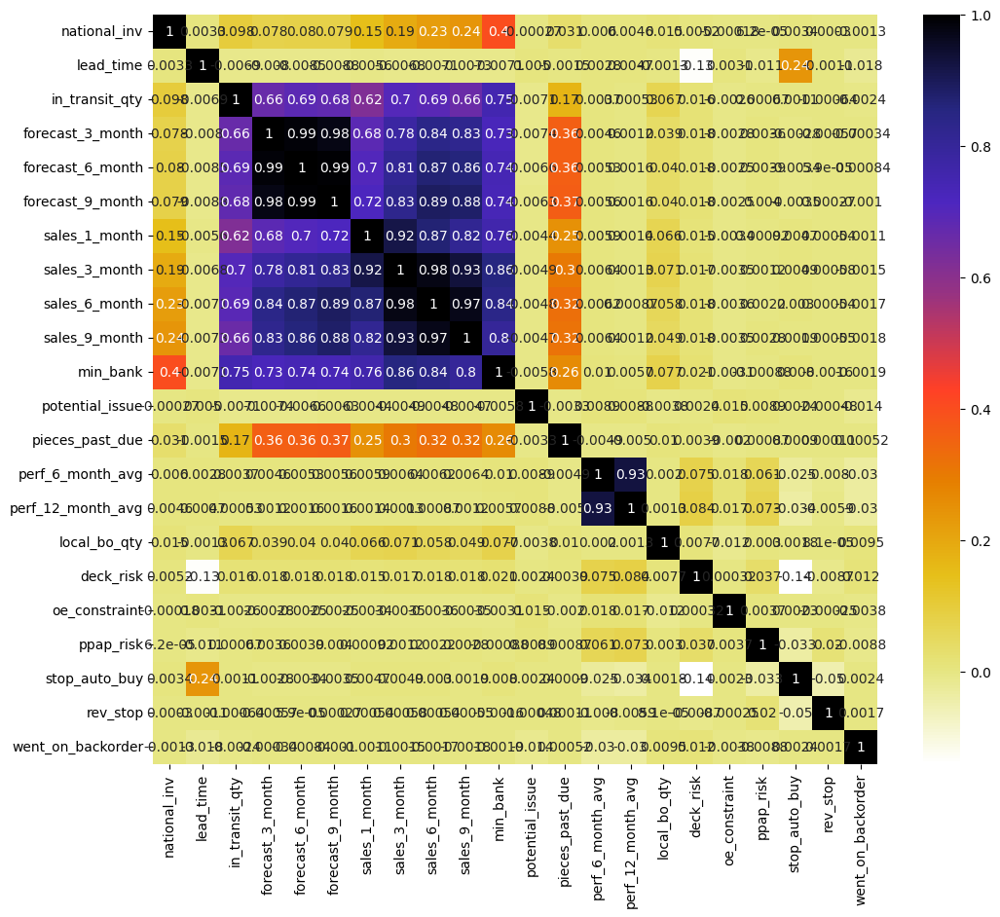

In [206]:
#Using Pearson Correlation
plt.figure(figsize=(12,10))
cor = df_corr_coef.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.CMRmap_r)
plt.show()

In [207]:
def correlation(dataset, threshold):
    col_corr = set()
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold:
                colname = corr_matrix.columns[i]
                col_corr.add(colname)
    return col_corr

In [209]:
corr_features = correlation(df_corr_coef, 0.7)
corr_features

{'forecast_6_month',
 'forecast_9_month',
 'min_bank',
 'perf_12_month_avg',
 'sales_1_month',
 'sales_3_month',
 'sales_6_month',
 'sales_9_month'}

These features will be dropped since they have multicolinearity

In [30]:
df_corr_coef.drop(corr_features,axis=1,inplace=True)
df_corr_coef.head()

,national_inv,lead_time,in_transit_qty,forecast_3_month,potential_issue,pieces_past_due,perf_6_month_avg,local_bo_qty,deck_risk,oe_constraint,ppap_risk,stop_auto_buy,rev_stop,went_on_backorder
0,0.0,8.0,0.0,0.0,1,0.0,0.99,0.0,1,1,1,0,1,0
1,2.0,9.0,0.0,0.0,1,0.0,0.99,0.0,1,1,1,0,1,0
2,2.0,8.0,0.0,0.0,1,0.0,0.99,0.0,0,1,1,0,1,0
3,7.0,8.0,0.0,0.0,1,0.0,0.10,0.0,1,1,1,0,1,0
4,8.0,8.0,0.0,0.0,1,0.0,0.99,0.0,0,1,1,0,1,0


In [31]:
## Using chi2 test
df_chi2 = df_train[['potential_issue', 'deck_risk', 'oe_constraint', 'ppap_risk', 'stop_auto_buy', 'rev_stop','went_on_backorder']]
df_chi2.head()

,potential_issue,deck_risk,oe_constraint,ppap_risk,stop_auto_buy,rev_stop,went_on_backorder
0,1,1,1,1,0,1,0
1,1,1,1,1,0,1,0
2,1,0,1,1,0,1,0
3,1,1,1,1,0,1,0
4,1,0,1,1,0,1,0


In [32]:
X_train,X_test,y_train,y_test=train_test_split(df_chi2[['potential_issue', 'deck_risk', 'oe_constraint', 'ppap_risk', 'stop_auto_buy', 'rev_stop']],
                                               df_chi2['went_on_backorder'],test_size=0.3,random_state=100)
X_train.head()

,potential_issue,deck_risk,oe_constraint,ppap_risk,stop_auto_buy,rev_stop
429367,1,1,1,1,0,1
947059,1,0,1,0,0,1
599236,1,1,1,1,0,1
807358,1,1,1,1,0,1
1099143,1,0,1,1,0,1


In [33]:
f_p_value=chi2(X_train,y_train)
f_p_value

(array([1.28567147e-01, 3.65670864e+01, 1.96732636e-03, 9.41331006e+00,
        8.18056615e+00, 1.45747430e-03]),
 array([7.19922320e-01, 1.47501349e-09, 9.64621788e-01, 2.15416005e-03,
        4.23415431e-03, 9.69546653e-01]))

In [34]:
p_value=pd.Series(f_p_value[1])
p_value.index=X_train.columns
p_value.sort_values(ascending=True)

deck_risk          1.475013e-09
ppap_risk          2.154160e-03
stop_auto_buy      4.234154e-03
potential_issue    7.199223e-01
oe_constraint      9.646218e-01
rev_stop           9.695467e-01
dtype: float64

deck_risk is the most important column as compared with other categorical variables, since it has the smallest pvalue

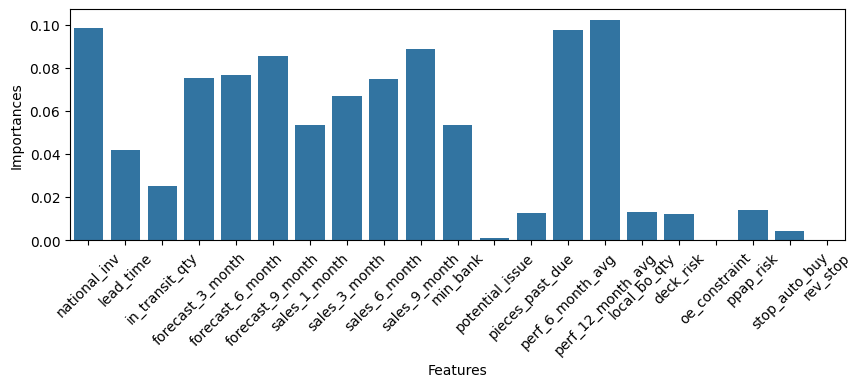

In [57]:
## Identifying important features using random forest
X=df_train.drop(['went_on_backorder'], axis=1)
y=df_train['went_on_backorder']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
rf=RandomForestClassifier(random_state=100, n_estimators=50)
rf.fit(X_train,y_train)
imp = rf.feature_importances_
rf_df = pd.DataFrame({"Features":X_train.columns, "Importances":imp})
rf_df.set_index("Importances")
rf_df.sort_values("Importances",ascending=True)
plt.figure(figsize=(10,3))
sns.barplot(x="Features",y="Importances", data=rf_df)
plt.xticks(rotation=45)
plt.show()

In [35]:
## Identifying top 15 features using SelectKBest
top_f = SelectKBest(k=15)
fit = top_f.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Feature','Score'] 
print(featureScores.nlargest(15,'Score')) 
ftr_list = featureScores['Feature'].to_list()

              Feature        Score
13   perf_6_month_avg  1500.173629
14  perf_12_month_avg  1473.843644
1           lead_time   553.372900
11    potential_issue   335.163422
16          deck_risk   230.729764
15       local_bo_qty   152.461354
18          ppap_risk   131.140228
17      oe_constraint    24.852226
2      in_transit_qty     9.945266
19      stop_auto_buy     9.916481
10           min_bank     5.884902
9       sales_9_month     5.250814
8       sales_6_month     5.042676
20           rev_stop     4.926003
7       sales_3_month     3.860038


In [127]:
## Feature selection using information gain
X=df_train.drop('went_on_backorder',axis=1)
y=df_train['went_on_backorder']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
mutual_info = mutual_info_classif(X_train, y_train)
mutual_info_df = pd.DataFrame(mutual_info, index=X_train.columns, columns=['Mutual Information'])
mutual_info_df = mutual_info_df.sort_values(by='Mutual Information', ascending=False)
print("Mutual Information scores for each feature:")
print(mutual_info_df)

Mutual Information scores for each feature:
                   Mutual Information
oe_constraint                0.271668
potential_issue              0.264987
rev_stop                     0.252135
ppap_risk                    0.218147
deck_risk                    0.214638
lead_time                    0.093285
perf_6_month_avg             0.023082
perf_12_month_avg            0.019410
national_inv                 0.005310
forecast_6_month             0.004854
forecast_3_month             0.004845
forecast_9_month             0.004569
stop_auto_buy                0.002267
sales_6_month                0.001608
sales_3_month                0.001593
sales_1_month                0.001466
sales_9_month                0.001392
local_bo_qty                 0.001057
pieces_past_due              0.000689
min_bank                     0.000293
in_transit_qty               0.000158


In [128]:
k = 5
selector = SelectKBest(mutual_info_classif, k=k)
selector.fit(X_train, y_train)
selected_columns = X_train.columns[selector.get_support()]
print(f"Top {k} features selected:")
print(selected_columns)
X_train_selected = selector.transform(X_train)
X_test_selected = selector.transform(X_test)

Top 5 features selected:
Index(['potential_issue', 'deck_risk', 'oe_constraint', 'ppap_risk',
       'rev_stop'],
      dtype='object')


In [210]:
## Feature selection using Vif- Variance inflation factor
X=df_train.drop('went_on_backorder',axis=1)
y=df_train['went_on_backorder']
X = sm.add_constant(X)


In [211]:
vif_data = pd.DataFrame()
vif_data["Feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Display VIF values
print("VIF values for each feature:")
print(vif_data)



VIF values for each feature:
              Feature           VIF
0               const  10977.054762
1        national_inv      1.873878
2           lead_time      1.074416
3      in_transit_qty      3.011432
4    forecast_3_month     91.635926
5    forecast_6_month    473.298071
6    forecast_9_month    267.051070
7       sales_1_month      7.622905
8       sales_3_month     61.730037
9       sales_6_month     97.997771
10      sales_9_month     20.745259
11           min_bank      7.430079
12    potential_issue      1.000527
13    pieces_past_due      1.180727
14   perf_6_month_avg      7.152063
15  perf_12_month_avg      7.175469
16       local_bo_qty      1.009630
17          deck_risk      1.040040
18      oe_constraint      1.000746
19          ppap_risk      1.007949
20      stop_auto_buy      1.080340
21           rev_stop      1.003352


In [147]:
# Drop the features with high VIF i.e VIF > 10
features_to_keep = vif_data[vif_data["VIF"] <= 10]["Feature"]
X_selected = df_train[features_to_keep]
print("Selected features with VIF <= 10:")
X_selected.head()

Selected features with VIF <= 10:


,national_inv,lead_time,in_transit_qty,sales_1_month,min_bank,potential_issue,pieces_past_due,perf_6_month_avg,perf_12_month_avg,local_bo_qty,deck_risk,oe_constraint,ppap_risk,stop_auto_buy,rev_stop
0,0.0,8.0,0.0,0.0,0.0,1,0.0,0.99,0.99,0.0,1,1,1,0,1
1,2.0,9.0,0.0,0.0,0.0,1,0.0,0.99,0.99,0.0,1,1,1,0,1
2,2.0,8.0,0.0,0.0,0.0,1,0.0,0.99,0.99,0.0,0,1,1,0,1
3,7.0,8.0,0.0,0.0,1.0,1,0.0,0.10,0.13,0.0,1,1,1,0,1
4,8.0,8.0,0.0,0.0,2.0,1,0.0,0.99,0.99,0.0,0,1,1,0,1


## Working on Test Data

In [21]:
df_test

,sku,national_inv,lead_time,in_transit_qty,forecast_3_month,forecast_6_month,forecast_9_month,sales_1_month,sales_3_month,sales_6_month,sales_9_month,min_bank,potential_issue,pieces_past_due,perf_6_month_avg,perf_12_month_avg,local_bo_qty,deck_risk,oe_constraint,ppap_risk,stop_auto_buy,rev_stop,went_on_backorder
0,3285085,62.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,No,0.0,-99.00,-99.00,0.0,Yes,No,No,Yes,No,No
1,3285131,9.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,No,0.0,-99.00,-99.00,0.0,No,No,Yes,No,No,No
2,3285358,17.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,No,0.0,0.92,0.95,0.0,No,No,No,Yes,No,No
3,3285517,9.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,No,0.0,0.78,0.75,0.0,No,No,Yes,Yes,No,No
4,3285608,2.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,No,0.0,0.54,0.71,0.0,No,No,No,Yes,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
242071,3526988,13.0,12.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,No,0.0,0.48,0.48,0.0,Yes,No,No,Yes,No,No
242072,3526989,13.0,12.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,No,0.0,0.48,0.48,0.0,Yes,No,No,Yes,No,No
242073,3526990,10.0,12.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,No,0.0,0.48,0.48,0.0,Yes,No,No,Yes,No,No
242074,3526991,2913.0,12.0,0.0,0.0,0.0,0.0,0.0,30.0,88.0,88.0,4.0,No,0.0,0.48,0.48,0.0,Yes,No,No,Yes,No,No


In [22]:
df_test.shape

(242076, 23)

In [23]:
df_test.isnull().sum()

sku                      0
national_inv             1
lead_time            14725
in_transit_qty           1
forecast_3_month         1
forecast_6_month         1
forecast_9_month         1
sales_1_month            1
sales_3_month            1
sales_6_month            1
sales_9_month            1
min_bank                 1
potential_issue          1
pieces_past_due          1
perf_6_month_avg         1
perf_12_month_avg        1
local_bo_qty             1
deck_risk                1
oe_constraint            1
ppap_risk                1
stop_auto_buy            1
rev_stop                 1
went_on_backorder        1
dtype: int64

In [24]:
## Identifying and eliminating the row with all NaN values
null_index = df_test[df_test['national_inv'].isnull()].index.tolist()
df_test = df_test.drop(null_index)

In [25]:
df_test.isnull().sum()

sku                      0
national_inv             0
lead_time            14724
in_transit_qty           0
forecast_3_month         0
forecast_6_month         0
forecast_9_month         0
sales_1_month            0
sales_3_month            0
sales_6_month            0
sales_9_month            0
min_bank                 0
potential_issue          0
pieces_past_due          0
perf_6_month_avg         0
perf_12_month_avg        0
local_bo_qty             0
deck_risk                0
oe_constraint            0
ppap_risk                0
stop_auto_buy            0
rev_stop                 0
went_on_backorder        0
dtype: int64

In [26]:
df_test['lead_time'] = df_test['lead_time'].fillna(df_test['lead_time'].median())

In [27]:
df_test.isnull().sum()

sku                  0
national_inv         0
lead_time            0
in_transit_qty       0
forecast_3_month     0
forecast_6_month     0
forecast_9_month     0
sales_1_month        0
sales_3_month        0
sales_6_month        0
sales_9_month        0
min_bank             0
potential_issue      0
pieces_past_due      0
perf_6_month_avg     0
perf_12_month_avg    0
local_bo_qty         0
deck_risk            0
oe_constraint        0
ppap_risk            0
stop_auto_buy        0
rev_stop             0
went_on_backorder    0
dtype: int64

In [28]:
df_test['perf_6_month_avg'] = df_test['perf_6_month_avg'].replace(-99.00,0.99)
df_test['perf_12_month_avg'] = df_test['perf_12_month_avg'].replace(-99.00,0.99)

In [29]:
df_test.drop(['sku'], axis=1, inplace=True)

In [30]:
## Mapping No as 1 and Yes as 0
mapping = {'Yes': 0, 'No': 1}
df_test['potential_issue'] = df_test['potential_issue'].map(mapping)
df_test['deck_risk'] = df_test['deck_risk'].map(mapping)
df_test['oe_constraint'] = df_test['oe_constraint'].map(mapping)
df_test['ppap_risk'] = df_test['ppap_risk'].map(mapping)
df_test['stop_auto_buy'] = df_test['stop_auto_buy'].map(mapping)
df_test['rev_stop'] = df_test['rev_stop'].map(mapping)
df_test['went_on_backorder'] = df_test['went_on_backorder'].map(mapping_target)

In [31]:
df_test

,national_inv,lead_time,in_transit_qty,forecast_3_month,forecast_6_month,forecast_9_month,sales_1_month,sales_3_month,sales_6_month,sales_9_month,min_bank,potential_issue,pieces_past_due,perf_6_month_avg,perf_12_month_avg,local_bo_qty,deck_risk,oe_constraint,ppap_risk,stop_auto_buy,rev_stop,went_on_backorder
0,62.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1,0.0,0.99,0.99,0.0,0,1,1,0,1,0
1,9.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1,0.0,0.99,0.99,0.0,1,1,0,1,1,0
2,17.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0.0,0.92,0.95,0.0,1,1,1,0,1,0
3,9.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,1,0.0,0.78,0.75,0.0,1,1,0,0,1,0
4,2.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0.0,0.54,0.71,0.0,1,1,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
242070,12.0,12.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1,0.0,0.48,0.48,0.0,0,1,1,0,1,0
242071,13.0,12.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1,0.0,0.48,0.48,0.0,0,1,1,0,1,0
242072,13.0,12.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1,0.0,0.48,0.48,0.0,0,1,1,0,1,0
242073,10.0,12.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1,0.0,0.48,0.48,0.0,0,1,1,0,1,0


In [32]:
for feature in numerical_features:
  print(df_test[feature].agg(['min', 'max']))
  print("\n")

min      -25414.0
max    12145792.0
Name: national_inv, dtype: float64


min     0.0
max    52.0
Name: lead_time, dtype: float64


min         0.0
max    265272.0
Name: in_transit_qty, dtype: float64


min          0.0
max    1510592.0
Name: forecast_3_month, dtype: float64


min          0.0
max    2157024.0
Name: forecast_6_month, dtype: float64


min          0.0
max    3162260.0
Name: forecast_9_month, dtype: float64


min         0.0
max    349620.0
Name: sales_1_month, dtype: float64


min          0.0
max    1099852.0
Name: sales_3_month, dtype: float64


min          0.0
max    2103389.0
Name: sales_6_month, dtype: float64


min          0.0
max    3195211.0
Name: sales_9_month, dtype: float64


min         0.0
max    303713.0
Name: min_bank, dtype: float64


min        0.0
max    79964.0
Name: pieces_past_due, dtype: float64


min    0.0
max    1.0
Name: perf_6_month_avg, dtype: float64


min    0.0
max    1.0
Name: perf_12_month_avg, dtype: float64


min       0.0
max    6232

## Deploying Models

In [33]:
X=df_train.drop('went_on_backorder',axis=1) ## Train
y=df_train['went_on_backorder']
X_test=df_test.drop('went_on_backorder',axis=1) ## Test
y_test=df_test['went_on_backorder']

### Random Forest

In [34]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=42,verbose=2)
rf_model.fit(X, y)
y_pred_rf = rf_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_rf)
RF=joblib.dump(rf_model, 'random_forest_model.pkl')
print(f'Accuracy: {accuracy:.2f}')

building tree 1 of 100
building tree 2 of 100
building tree 3 of 100
building tree 4 of 100
building tree 5 of 100
building tree 6 of 100
building tree 7 of 100
building tree 8 of 100
building tree 9 of 100
building tree 10 of 100
building tree 11 of 100
building tree 12 of 100
building tree 13 of 100
building tree 14 of 100
building tree 15 of 100
building tree 16 of 100
building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
building tree 22 of 100
building tree 23 of 100
building tree 24 of 100
building tree 25 of 100
building tree 26 of 100
building tree 27 of 100
building tree 28 of 100
building tree 29 of 100
building tree 30 of 100
building tree 31 of 100
building tree 32 of 100
building tree 33 of 100
building tree 34 of 100
building tree 35 of 100
building tree 36 of 100
building tree 37 of 100
building tree 38 of 100
building tree 39 of 100
building tree 40 of 100


[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:  4.8min


building tree 41 of 100
building tree 42 of 100
building tree 43 of 100
building tree 44 of 100
building tree 45 of 100
building tree 46 of 100
building tree 47 of 100
building tree 48 of 100
building tree 49 of 100
building tree 50 of 100
building tree 51 of 100
building tree 52 of 100
building tree 53 of 100
building tree 54 of 100
building tree 55 of 100
building tree 56 of 100
building tree 57 of 100
building tree 58 of 100
building tree 59 of 100
building tree 60 of 100
building tree 61 of 100
building tree 62 of 100
building tree 63 of 100
building tree 64 of 100
building tree 65 of 100
building tree 66 of 100
building tree 67 of 100
building tree 68 of 100
building tree 69 of 100
building tree 70 of 100
building tree 71 of 100
building tree 72 of 100
building tree 73 of 100
building tree 74 of 100
building tree 75 of 100
building tree 76 of 100
building tree 77 of 100
building tree 78 of 100
building tree 79 of 100
building tree 80 of 100
building tree 81 of 100
building tree 82

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    3.3s


Accuracy: 0.99


In [35]:
print(classification_report(y_test,y_pred_rf))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99    239387
           1       0.55      0.01      0.02      2688

    accuracy                           0.99    242075
   macro avg       0.77      0.51      0.51    242075
weighted avg       0.98      0.99      0.98    242075



In [37]:
y_pred_rf = rf_model.predict(X)
print(classification_report(y,y_pred_rf))

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:   23.5s


              precision    recall  f1-score   support

           0       1.00      1.00      1.00   1676567
           1       0.99      0.94      0.97     11293

    accuracy                           1.00   1687860
   macro avg       1.00      0.97      0.98   1687860
weighted avg       1.00      1.00      1.00   1687860



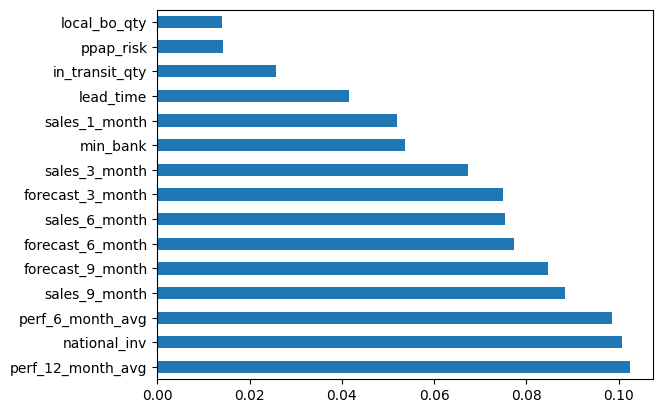

In [83]:
RF=joblib.load('random_forest_model.pkl')
feat_importances = pd.Series(RF.feature_importances_, index=X.columns)
feat_importances.nlargest(15).plot(kind='barh')
plt.show()

In [40]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=42, criterion='entropy')
rf_model.fit(X, y)
y_pred_rf = rf_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_rf)
RF=joblib.dump(rf_model, 'random_forest_model.pkl')
print(f'Accuracy: {accuracy:.2f}')

Accuracy: 0.99


In [41]:
print(classification_report(y_test,y_pred_rf))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99    239387
           1       0.50      0.01      0.02      2688

    accuracy                           0.99    242075
   macro avg       0.74      0.50      0.51    242075
weighted avg       0.98      0.99      0.98    242075



### Decision Tree

In [108]:
dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(X, y)
y_pred_dt = dt_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_dt)
DT=joblib.dump(dt_model, 'decision_tree_model.pkl')
print(f'Accuracy: {accuracy:.2f}')

Accuracy: 0.99


In [119]:
y_test_proba = dt_model.predict_proba(X_test)
np.set_printoptions(threshold=np.inf)
print(y_test_proba)

[[1.         0.        ]
 [1.         0.        ]
 [1.         0.        ]
 [1.         0.        ]
 [1.         0.        ]
 [1.         0.        ]
 [0.99602505 0.00397495]
 [1.         0.        ]
 [1.         0.        ]
 [1.         0.        ]
 [1.         0.        ]
 [0.99602505 0.00397495]
 [1.         0.        ]
 [1.         0.        ]
 [0.99602505 0.00397495]
 [1.         0.        ]
 [0.99602505 0.00397495]
 [1.         0.        ]
 [1.         0.        ]
 [1.         0.        ]
 [1.         0.        ]
 [1.         0.        ]
 [1.         0.        ]
 [1.         0.        ]
 [1.         0.        ]
 [1.         0.        ]
 [1.         0.        ]
 [1.         0.        ]
 [1.         0.        ]
 [1.         0.        ]
 [1.         0.        ]
 [1.         0.        ]
 [1.         0.        ]
 [1.         0.        ]
 [1.         0.        ]
 [1.         0.        ]
 [1.         0.        ]
 [1.         0.        ]
 [1.         0.        ]
 [1.         0.        ]


In [120]:
proba_df = pd.DataFrame(y_test_proba, columns=dt_model.classes_)

In [122]:
proba_df.to_csv('Prob_scores.csv',encoding='utf-8')

In [85]:
y_pred_dt = dt_model.predict(X_test)
print(classification_report(y_test,y_pred_dt))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99    239387
           1       0.23      0.09      0.13      2688

    accuracy                           0.99    242075
   macro avg       0.61      0.54      0.56    242075
weighted avg       0.98      0.99      0.98    242075



In [86]:
y_pred_dt = dt_model.predict(X_train)
print(classification_report(y_train,y_pred_dt))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00   1173682
           1       1.00      0.94      0.97      7820

    accuracy                           1.00   1181502
   macro avg       1.00      0.97      0.98   1181502
weighted avg       1.00      1.00      1.00   1181502



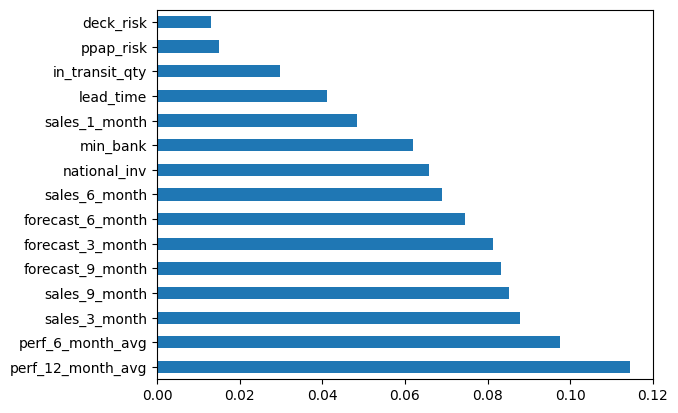

In [87]:
DT=joblib.load('decision_tree_model.pkl')
feat_importances = pd.Series(DT.feature_importances_, index=X.columns)
feat_importances.nlargest(15).plot(kind='barh')
plt.show()

### XG Boost

In [88]:
xg_model = XGBClassifier(eval_metric='logloss')
xg_model.fit(X, y)
y_pred_xg = xg_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_xg)
XG=joblib.dump(xg_model, 'xg_model.pkl')
print(f'Accuracy: {accuracy:.2f}')


Accuracy: 0.99


In [89]:
print(classification_report(y_test,y_pred_xg))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99    239387
           1       0.63      0.02      0.05      2688

    accuracy                           0.99    242075
   macro avg       0.81      0.51      0.52    242075
weighted avg       0.99      0.99      0.98    242075



In [90]:
y_pred_xg = xg_model.predict(X_train)
print(classification_report(y_train,y_pred_xg))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00   1173682
           1       0.85      0.14      0.25      7820

    accuracy                           0.99   1181502
   macro avg       0.92      0.57      0.62   1181502
weighted avg       0.99      0.99      0.99   1181502



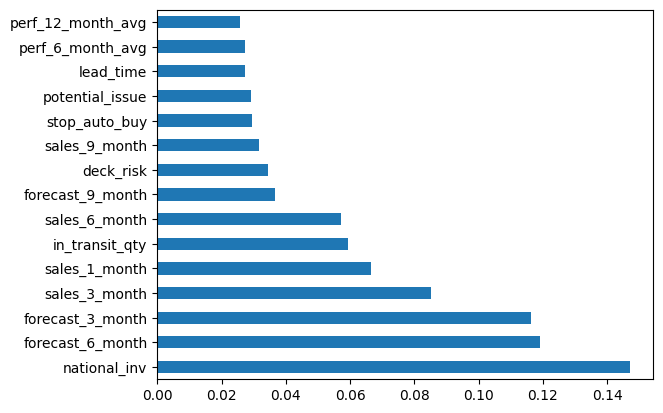

In [91]:
XG=joblib.load('xg_model.pkl')
feat_importances = pd.Series(XG.feature_importances_, index=X.columns)
feat_importances.nlargest(15).plot(kind='barh')
plt.show()

### Logistic Regression

In [94]:
log_model = LogisticRegression()
log_model.fit(X,y)
y_pred_lr = log_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_lr)
LOG =joblib.dump(log_model, 'log_model.pkl')
print(f'Accuracy: {accuracy:.2f}')

Accuracy: 0.99


C:\Users\Asus\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [96]:
print(classification_report(y_test,y_pred_lr))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99    239387
           1       0.09      0.00      0.00      2688

    accuracy                           0.99    242075
   macro avg       0.54      0.50      0.50    242075
weighted avg       0.98      0.99      0.98    242075



In [101]:
y_pred_lr = log_model.predict(X_train)
print(classification_report(y_train,y_pred_lr))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00   1173682
           1       0.03      0.00      0.00      7820

    accuracy                           0.99   1181502
   macro avg       0.51      0.50      0.50   1181502
weighted avg       0.99      0.99      0.99   1181502



### Gradient Boosting

In [103]:
gb_model = GradientBoostingClassifier()
gb_model.fit(X, y)
y_pred_gb = gb_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_gb)
GB =joblib.dump(gb_model, 'gb_model.pkl')
print(f'Accuracy: {accuracy:.2f}')

Accuracy: 0.99


In [104]:
print(classification_report(y_test,y_pred_gb))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99    239387
           1       0.53      0.03      0.06      2688

    accuracy                           0.99    242075
   macro avg       0.76      0.51      0.52    242075
weighted avg       0.98      0.99      0.98    242075



In [105]:
y_pred_gb = gb_model.predict(X_train)
print(classification_report(y_train,y_pred_gb))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00   1173682
           1       0.47      0.04      0.08      7820

    accuracy                           0.99   1181502
   macro avg       0.73      0.52      0.54   1181502
weighted avg       0.99      0.99      0.99   1181502



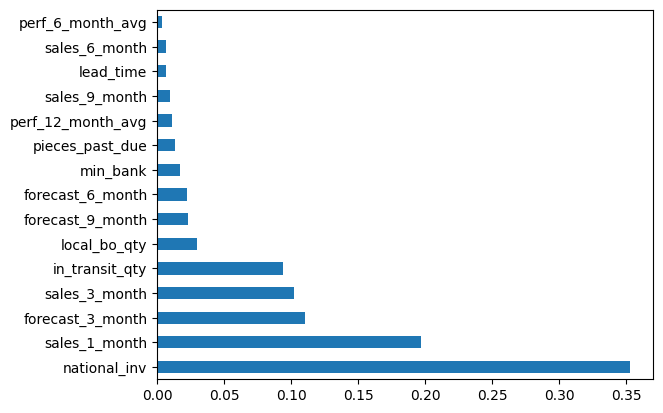

In [106]:
GB=joblib.load('gb_model.pkl')
feat_importances = pd.Series(GB.feature_importances_, index=X.columns)
feat_importances.nlargest(15).plot(kind='barh')
plt.show()

### KNN

In [107]:
knn_model = KNeighborsClassifier(n_neighbors=5, weights='uniform')
knn_model.fit(X,y)
y_pred_knn = knn_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_knn)
KNN =joblib.dump(knn_model, 'knn_model.pkl')
print(f'Accuracy: {accuracy:.2f}')

Accuracy: 0.99


In [108]:
print(classification_report(y_test,y_pred_knn))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99    239387
           1       0.18      0.02      0.04      2688

    accuracy                           0.99    242075
   macro avg       0.58      0.51      0.52    242075
weighted avg       0.98      0.99      0.98    242075



In [ ]:
y_pred_knn = knn_model.predict(X_train)
print(classification_report(y_train,y_pred_knn))

### Adaboost

In [109]:
ada_model = AdaBoostClassifier(n_estimators=100, random_state=42)
AdaBoostClassifier()
ada_model.fit(X, y)
y_pred_ada = ada_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_ada)
ADA =joblib.dump(ada_model, 'ada_model.pkl')
print(f'Accuracy: {accuracy:.2f}')

C:\Users\Asus\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Accuracy: 0.99


In [110]:
print(classification_report(y_test,y_pred_ada))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99    239387
           1       0.40      0.03      0.05      2688

    accuracy                           0.99    242075
   macro avg       0.69      0.51      0.52    242075
weighted avg       0.98      0.99      0.98    242075



In [111]:
y_pred_ada = ada_model.predict(X_train)
print(classification_report(y_train,y_pred_ada))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00   1173682
           1       0.35      0.04      0.08      7820

    accuracy                           0.99   1181502
   macro avg       0.67      0.52      0.54   1181502
weighted avg       0.99      0.99      0.99   1181502



In [42]:
## Oversample the minority class using SMOTE
smote = SMOTE()
X_train_resampled, y_train_resampled = smote.fit_resample(X, y)

In [70]:
df_test['went_on_backorder'].value_counts()

went_on_backorder
1    239387
0      2688
Name: count, dtype: int64

### Logistic regression after SMOTE

In [146]:
model = LogisticRegression(random_state=42,solver="liblinear")
model.fit(X_train_resampled, y_train_resampled)
y_pred_lr_resamp = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_lr_resamp)
print("Accuracy:", accuracy)

Accuracy: 0.8848125580915006


C:\Users\Asus\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


In [147]:
print(classification_report(y_test,y_pred_lr_resamp))

              precision    recall  f1-score   support

           0       0.99      0.89      0.94    239387
           1       0.06      0.59      0.10      2688

    accuracy                           0.88    242075
   macro avg       0.53      0.74      0.52    242075
weighted avg       0.98      0.88      0.93    242075



In [148]:
y_pred_lr_resamp = model.predict(X_train_resampled)
print(classification_report(y_train_resampled,y_pred_lr_resamp))

              precision    recall  f1-score   support

           0       0.72      0.89      0.79   1676567
           1       0.85      0.65      0.74   1676567

    accuracy                           0.77   3353134
   macro avg       0.78      0.77      0.76   3353134
weighted avg       0.78      0.77      0.76   3353134



In [156]:
y_train_proba_lr = model.predict_proba(X_train_resampled)
y_test_proba_lr = model.predict_proba(X_test)


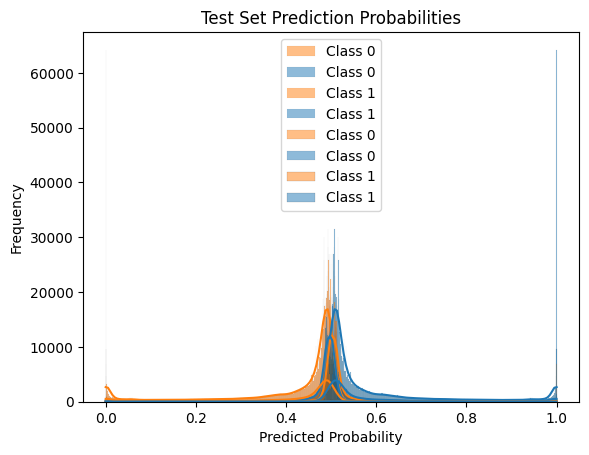

In [150]:
def plot_prediction_probabilities(y_true, y_pred_proba, title='Prediction Probabilities'):
    sns.histplot(y_pred_proba[y_true == 0], color='blue', kde=True, label='Class 0')
    sns.histplot(y_pred_proba[y_true == 1], color='red', kde=True, label='Class 1')
    plt.title(title)
    plt.xlabel('Predicted Probability')
    plt.ylabel('Frequency')
    plt.legend()
# Assuming you have y_train_proba, y_test_proba
plot_prediction_probabilities(y_train_resampled, y_train_proba, title='Training Set Prediction Probabilities')
plot_prediction_probabilities(y_test, y_test_proba, title='Test Set Prediction Probabilities')

In [151]:
def plot_learning_curve(estimator, X, y, title='Learning Curve', cv=None, n_jobs=None, train_sizes=np.linspace(.1, 1.0, 5)):
    plt.figure()
    plt.title(title)
    plt.xlabel('Training examples')
    plt.ylabel('Score')

 

    train_sizes, train_scores, test_scores = learning_curve(estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)

 

    plt.grid()
    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1, color='r')
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color='g')
    plt.plot(train_sizes, train_scores_mean, 'o-', color='r', label='Training score')
    plt.plot(train_sizes, test_scores_mean, 'o-', color='g', label='Cross-validation score')
    plt.legend(loc='best')
    plt.show()
  

C:\Users\Asus\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Asus\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Asus\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Asus\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning: Liblinear fail

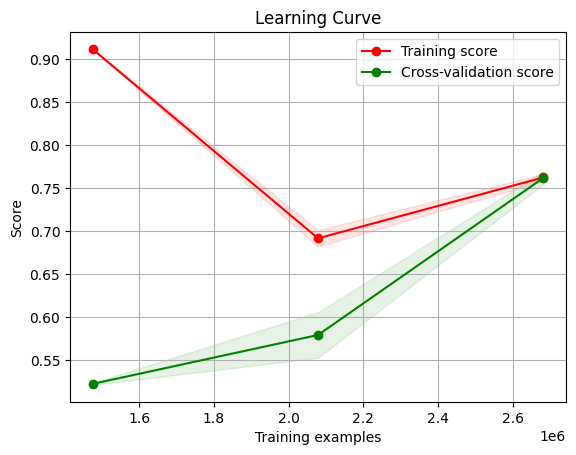

In [55]:
plot_learning_curve(model, X_train_resampled, y_train_resampled)

ROC AUC: 0.8573693859459885


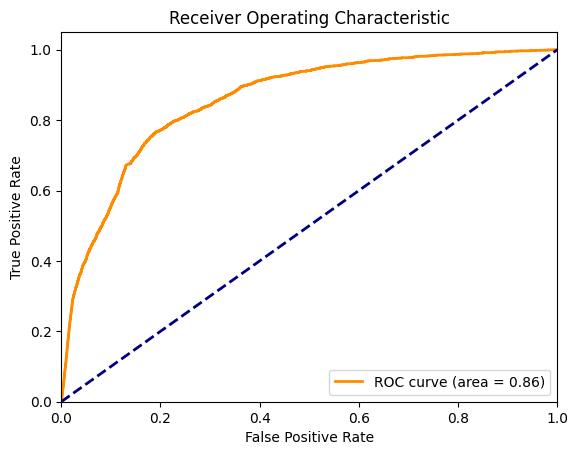

In [152]:
fpr, tpr, thresholds = roc_curve(y_test, y_test_proba[:,1])

# Calculate AUC
roc_auc = auc(fpr, tpr)

# Print AUC
print(f'ROC AUC: {roc_auc}')

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

In [176]:
thresholds

array([            inf, 1.00000000e+000, 1.00000000e+000, ...,
       2.81546846e-062, 2.74681065e-303, 0.00000000e+000])

ROC AUC: 0.8573693859459885


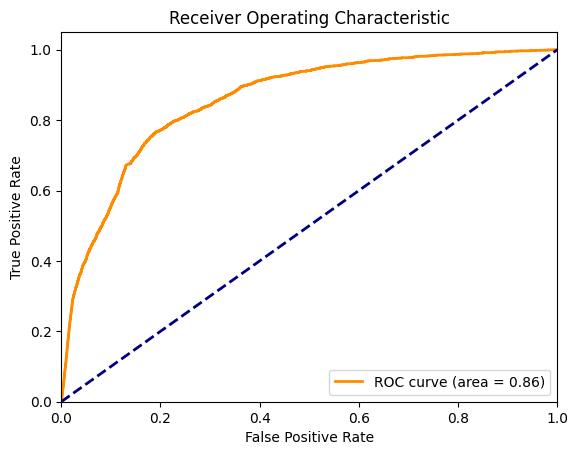

In [153]:
    
fpr, tpr, thresholds = roc_curve(y_test,y_test_proba[:,1])

# Calculate AUC
roc_auc = auc(fpr, tpr)

# Print AUC
print(f'ROC AUC: {roc_auc}')

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

ROC AUC: 0.5932527283662716


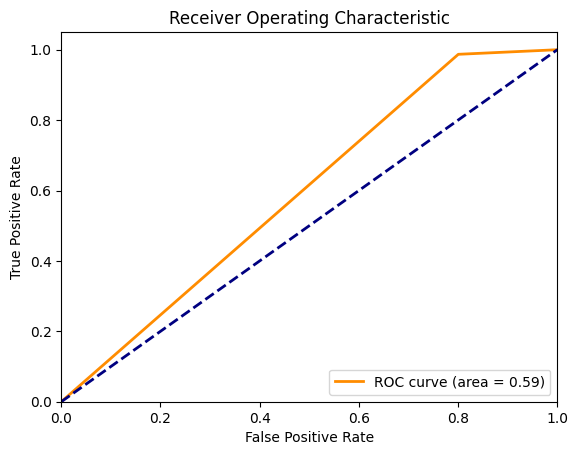

In [127]:
    
fpr, tpr, thresholds = roc_curve(y_test,y_test_proba[:,1]>0.35)

# Calculate AUC
roc_auc = auc(fpr, tpr)

# Print AUC
print(f'ROC AUC: {roc_auc}')

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

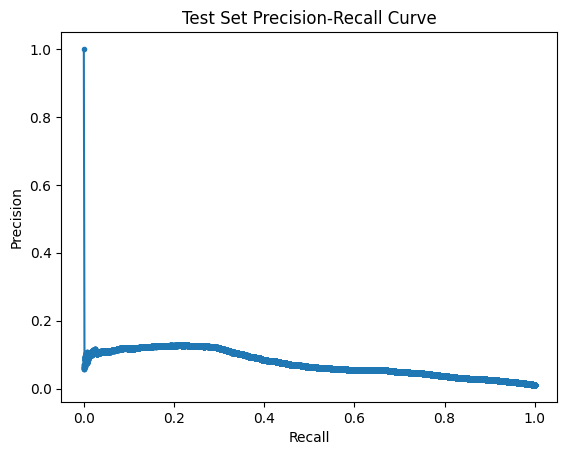

In [155]:

def plot_precision_recall_curve(y_true, y_pred_proba, title='Precision-Recall Curve'):

    precision, recall, thresholds = precision_recall_curve(y_true, y_pred_proba)

    plt.plot(recall, precision, marker='.')

    plt.xlabel('Recall')

    plt.ylabel('Precision')

    plt.title(title)

    plt.show()

 

 

plot_precision_recall_curve(y_test, y_test_proba[:,1], title='Test Set Precision-Recall Curve')

### Random forest after SMOTE

In [128]:
rf_model_resamp = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model_resamp.fit(X_train_resampled, y_train_resampled)
y_pred_rf_resamp = rf_model_resamp.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_rf_resamp)
RF=joblib.dump(rf_model_resamp, 'random_forest_model.pkl')
print(f'Accuracy: {accuracy:.2f}')

Accuracy: 0.99


In [129]:
print(classification_report(y_test,y_pred_rf_resamp))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99    239387
           1       0.32      0.08      0.12      2688

    accuracy                           0.99    242075
   macro avg       0.66      0.54      0.56    242075
weighted avg       0.98      0.99      0.98    242075



In [131]:
y_pred_rf_resamp = rf_model_resamp.predict(X_train_resampled)
print(classification_report(y_train_resampled,y_pred_rf_resamp))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00   1676567
           1       1.00      1.00      1.00   1676567

    accuracy                           1.00   3353134
   macro avg       1.00      1.00      1.00   3353134
weighted avg       1.00      1.00      1.00   3353134



In [157]:
y_train_proba_rf = rf_model_resamp.predict_proba(X_train_resampled)
y_test_proba_rf = rf_model_resamp.predict_proba(X_test)

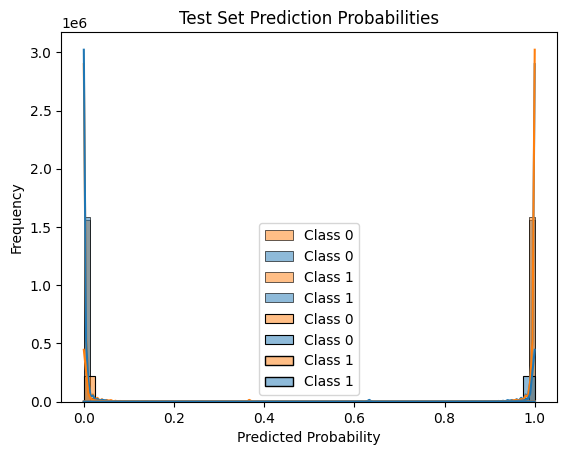

In [133]:
def plot_prediction_probabilities(y_true, y_pred_proba, title='Prediction Probabilities'):
    sns.histplot(y_pred_proba[y_true == 0], color='blue', kde=True, label='Class 0')
    sns.histplot(y_pred_proba[y_true == 1], color='red', kde=True, label='Class 1')
    plt.title(title)
    plt.xlabel('Predicted Probability')
    plt.ylabel('Frequency')
    plt.legend()
# Assuming you have y_train_proba, y_test_proba
plot_prediction_probabilities(y_train_resampled, y_train_proba, title='Training Set Prediction Probabilities')
plot_prediction_probabilities(y_test, y_test_proba, title='Test Set Prediction Probabilities')

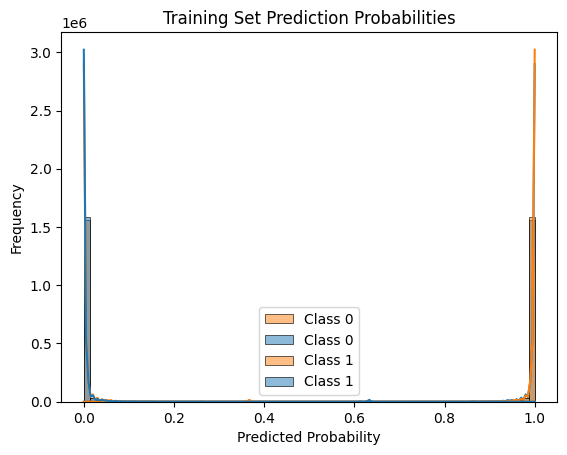

In [142]:
plot_prediction_probabilities(y_train_resampled, y_train_proba, title='Training Set Prediction Probabilities')


C:\Users\Asus\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Asus\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Asus\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Asus\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning: Liblinear fail

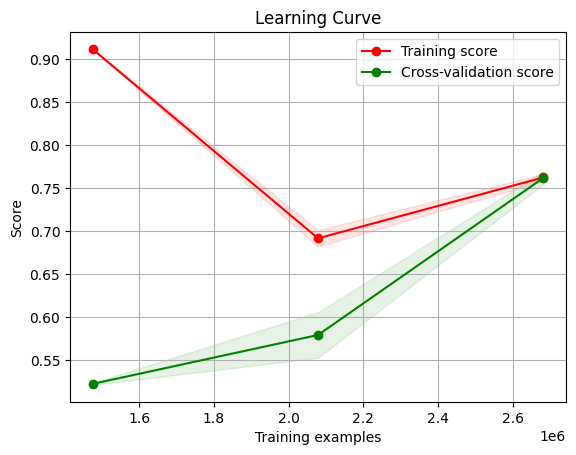

In [134]:
def plot_learning_curve(estimator, X, y, title='Learning Curve', cv=None, n_jobs=None, train_sizes=np.linspace(.1, 1.0, 5)):
    plt.figure()
    plt.title(title)
    plt.xlabel('Training examples')
    plt.ylabel('Score')

 

    train_sizes, train_scores, test_scores = learning_curve(estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)

 

    plt.grid()
    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1, color='r')
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color='g')
    plt.plot(train_sizes, train_scores_mean, 'o-', color='r', label='Training score')
    plt.plot(train_sizes, test_scores_mean, 'o-', color='g', label='Cross-validation score')
    plt.legend(loc='best')
    plt.show()


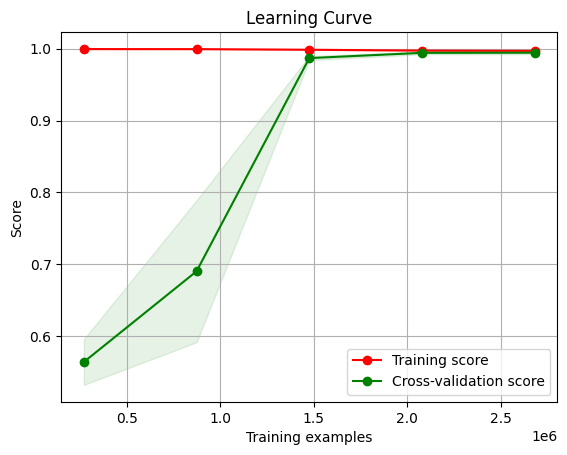

In [135]:
plot_learning_curve(rf_model_resamp, X_train_resampled, y_train_resampled)

ROC AUC: 0.8573693859459885


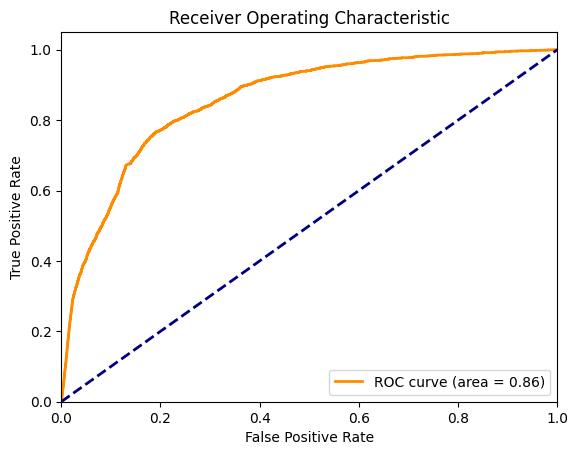

In [177]:
fpr, tpr, thresholds = roc_curve(y_test, y_test_proba[:,1])

# Calculate AUC
roc_auc = auc(fpr, tpr)

# Print AUC
print(f'ROC AUC: {roc_auc}')

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

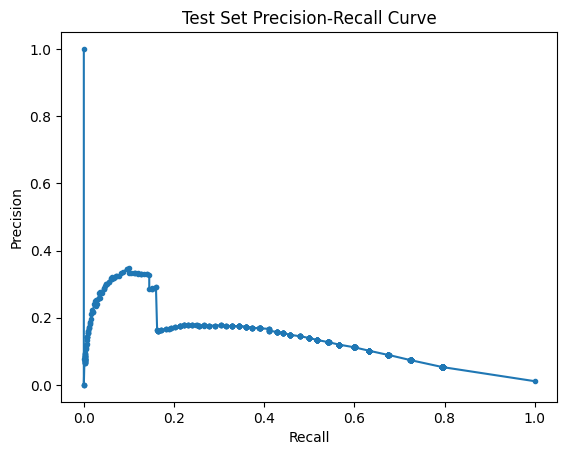

In [145]:

def plot_precision_recall_curve(y_true, y_pred_proba, title='Precision-Recall Curve'):
    precision, recall, thresholds = precision_recall_curve(y_true, y_pred_proba)
    plt.plot(recall, precision, marker='.')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(title)
    plt.show()

plot_precision_recall_curve(y_test, y_test_proba[:,1], title='Test Set Precision-Recall Curve')

In [158]:
newstack = np.column_stack((y_test_proba_rf,y_test_proba_lr))

In [175]:
rf_new = RandomForestClassifier(random_state=42)
rf_new.fit(newstack,y_test)
rf_new_pred = rf_new.predict(newstack)
print(classification_report(rf_new_pred, y_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    239643
           1       0.90      0.99      0.94      2432

    accuracy                           1.00    242075
   macro avg       0.95      1.00      0.97    242075
weighted avg       1.00      1.00      1.00    242075



In [173]:
lr_new=LogisticRegression(random_state=42, solver="liblinear")
lr_new.fit(newstack,y_test)
lr_new_pred = lr_new.predict(newstack)
print(classification_report(lr_new_pred, y_test))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99    241710
           1       0.04      0.27      0.06       365

    accuracy                           0.99    242075
   macro avg       0.52      0.63      0.53    242075
weighted avg       1.00      0.99      0.99    242075



### Random forest after removing features with multicolinearity

In [123]:
df_test_corr = df_test.copy()
df_test_corr.drop(corr_features,axis=1,inplace=True)

In [142]:
X=df_corr_coef.drop('went_on_backorder',axis=1)
y=df_corr_coef['went_on_backorder']
X_train_corr = X_train.copy()
y_train_corr = y_train.copy()
X_train_corr.drop(columns=corr_features,axis=1,inplace=True)
y_train_corr.drop(columns=corr_features,inplace=True)

In [125]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X, y)
X_test=df_test_corr.drop('went_on_backorder',axis=1)
y_test=df_test_corr['went_on_backorder']
y_pred_rf_corr = rf_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_rf_corr)
print(f'Accuracy: {accuracy:.2f}')

Accuracy: 0.99


In [143]:
y_pred_rf_corr = rf_model.predict(X_train_corr)
print(classification_report(y_train_corr,y_pred_rf_corr))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00   1173682
           1       0.95      0.60      0.73      7820

    accuracy                           1.00   1181502
   macro avg       0.97      0.80      0.87   1181502
weighted avg       1.00      1.00      1.00   1181502



In [126]:
print(classification_report(y_test,y_pred_rf_corr))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99    239387
           1       0.31      0.02      0.04      2688

    accuracy                           0.99    242075
   macro avg       0.65      0.51      0.52    242075
weighted avg       0.98      0.99      0.98    242075



### Random forest after ADASYN

In [148]:
adasyn = ADASYN(random_state=42)
X_train_res, y_train_res = adasyn.fit_resample(X, y)

In [149]:

rf_model = RandomForestClassifier(n_estimators=100, random_state=42, criterion='gini')
rf_model.fit(X_train_res, y_train_res)
y_pred_rf_ada = rf_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_rf_ada)
RF=joblib.dump(rf_model, 'random_forest_model.pkl')
print(f'Accuracy: {accuracy:.2f}')

Accuracy: 0.99


In [150]:
print(classification_report(y_test,y_pred_rf_ada))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99    239387
           1       0.31      0.08      0.12      2688

    accuracy                           0.99    242075
   macro avg       0.65      0.54      0.56    242075
weighted avg       0.98      0.99      0.98    242075



In [151]:
y_pred_rf_ada = rf_model.predict(X_train_res)
print(classification_report(y_train_res,y_pred_rf_ada))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00   1676567
           1       1.00      0.99      1.00   1676745

    accuracy                           1.00   3353312
   macro avg       1.00      1.00      1.00   3353312
weighted avg       1.00      1.00      1.00   3353312



In [71]:
## train test validation
X_train, X_test, y_train, y_test = train_test_split(df_train.drop('went_on_backorder', axis=1), df_train['went_on_backorder'], test_size=0.3, random_state=42)
X_val = df_test.drop('went_on_backorder', axis=1)
y_val = df_test['went_on_backorder']
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X_val)
accuracy = accuracy_score(y_val, y_pred)
print(f'Accuracy: {accuracy:.2f}')

Accuracy: 0.99


In [75]:
print(classification_report(y_val,y_pred))

              precision    recall  f1-score   support

           0       0.57      0.01      0.03      2688
           1       0.99      1.00      0.99    239387

    accuracy                           0.99    242075
   macro avg       0.78      0.51      0.51    242075
weighted avg       0.98      0.99      0.98    242075



In [79]:
cm_val = confusion_matrix(y_val, y_pred)

In [89]:
## Decreasing the number of trees
X_train, X_test, y_train, y_test = train_test_split(df_train.drop('went_on_backorder', axis=1), df_train['went_on_backorder'], test_size=0.3, random_state=42)
X_val = df_test.drop('went_on_backorder', axis=1)
y_val = df_test['went_on_backorder']
rf_model = RandomForestClassifier(n_estimators=50, random_state=42)
rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X_val)
accuracy = accuracy_score(y_val, y_pred)
print(f'Accuracy: {accuracy:.2f}')

Accuracy: 0.99


In [86]:
print(classification_report(y_val,y_pred))

              precision    recall  f1-score   support

           0       0.51      0.01      0.03      2688
           1       0.99      1.00      0.99    239387

    accuracy                           0.99    242075
   macro avg       0.75      0.51      0.51    242075
weighted avg       0.98      0.99      0.98    242075



In [87]:
## Increasing the number of trees
X_train, X_test, y_train, y_test = train_test_split(df_train.drop('went_on_backorder', axis=1), df_train['went_on_backorder'], test_size=0.3, random_state=42)
X_val = df_test.drop('went_on_backorder', axis=1)
y_val = df_test['went_on_backorder']
rf_model = RandomForestClassifier(n_estimators=200, random_state=42)
rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X_val)
accuracy = accuracy_score(y_val, y_pred)
print(f'Accuracy: {accuracy:.2f}')

Accuracy: 0.99


In [88]:
print(classification_report(y_val,y_pred))

              precision    recall  f1-score   support

           0       0.58      0.01      0.02      2688
           1       0.99      1.00      0.99    239387

    accuracy                           0.99    242075
   macro avg       0.78      0.51      0.51    242075
weighted avg       0.98      0.99      0.98    242075



In [90]:
## Using grid search with gradient boosting
param_grid = {
    'n_estimators': [50, 100],
    'learning_rate': [0.01, 0.1, 0.2]}
gb_model = GradientBoostingClassifier(random_state=42)
grid_search = GridSearchCV(estimator=gb_model, param_grid=param_grid, scoring='recall', cv=3, n_jobs=-1, verbose=2)
grid_search.fit(X_train, y_train)
best_gb_model = grid_search.best_estimator_
y_pred_val = best_gb_model.predict(X_val)
recall_val = recall_score(y_val, y_pred_val)
print(f'Recall on Validation Set: {recall_val:.2f}')
y_pred_test = best_gb_model.predict(X_test)
recall_test = recall_score(y_test, y_pred_test)
print(f'Recall on Test Set: {recall_test:.2f}')

Fitting 3 folds for each of 6 candidates, totalling 18 fits
Recall on Validation Set: 1.00
Recall on Test Set: 1.00


In [91]:
print('Classification Report on Test Set:')
print(classification_report(y_test, y_pred_test))

Classification Report on Test Set:


C:\Users\Asus\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Asus\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00      3473
           1       0.99      1.00      1.00    502885

    accuracy                           0.99    506358
   macro avg       0.50      0.50      0.50    506358
weighted avg       0.99      0.99      0.99    506358



C:\Users\Asus\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [63]:
model = GradientBoostingClassifier(
    n_estimators=100,       
    max_depth=3,                 
    learning_rate=0.1,      
    max_features='sqrt',   
    random_state=42,
    verbose=2)

model.fit(X_train, y_train)

y_val_pred = model.predict(X_val)
val_accuracy = accuracy_score(y_val, y_val_pred)
print(f'Validation Accuracy: {val_accuracy}')
print(f'Validation Classification Report:\n{classification_report(y_val, y_val_pred)}')


y_test_pred = model.predict(X_test)
test_accuracy = accuracy_score(y_test, y_test_pred)
print(f'Test Accuracy: {test_accuracy}')
print(f'Test Classification Report:\n{classification_report(y_test, y_test_pred)}')

      Iter       Train Loss   Remaining Time 
         1           0.0769            1.48m
         2           0.0729            1.53m
         3           0.0709            1.48m
         4           0.0685            1.51m
         5           0.0671            1.61m
         6           0.0656            1.64m
         7           0.0647            1.66m
         8           0.0641            1.68m
         9           0.0635            1.67m
        10           0.0628            1.66m
        11           0.0623            1.64m
        12           0.0618            1.63m
        13           0.0611            1.62m
        14           0.0608            1.62m
        15           0.0606            1.60m
        16           0.0603            1.59m
        17           0.0601            1.57m
        18           0.0599            1.56m
        19           0.0597            1.54m
        20           0.0593            1.53m
        21           0.0592            1.51m
        2

In [64]:
rf_model = RandomForestClassifier(random_state=42)

param_grid = {
    'n_estimators': [50, 100],
    'max_features': ['auto', 'sqrt', 'log2']}

grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2)
grid_search.fit(X_train, y_train)
best_model = grid_search.best_estimator_

y_val_pred = best_model.predict(X_val)
val_accuracy = accuracy_score(y_val, y_val_pred)
print(f'Validation Accuracy: {val_accuracy}')
print(f'Validation Classification Report:\n{classification_report(y_val, y_val_pred)}')

y_test_pred = best_model.predict(X_test)
test_accuracy = accuracy_score(y_test, y_test_pred)
print(f'Test Accuracy: {test_accuracy}')
print(f'Test Classification Report:\n{classification_report(y_test, y_test_pred)}')

Fitting 5 folds for each of 6 candidates, totalling 30 fits


C:\Users\Asus\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning: 
10 fits failed out of a total of 30.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
9 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\Asus\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Asus\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages

Validation Accuracy: 0.988937312816276
Validation Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99    239387
           1       0.58      0.01      0.03      2688

    accuracy                           0.99    242075
   macro avg       0.78      0.51      0.51    242075
weighted avg       0.98      0.99      0.98    242075

Test Accuracy: 0.9945493109618097
Test Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      1.00    502885
           1       0.87      0.24      0.38      3473

    accuracy                           0.99    506358
   macro avg       0.93      0.62      0.69    506358
weighted avg       0.99      0.99      0.99    506358



### Kfold cross validation

In [70]:
model = RandomForestClassifier(n_estimators=100, random_state=42, verbose=2)

kf = KFold(n_splits=5, shuffle=True, random_state=42)
cv_results = cross_val_score(model, X, y, cv=kf, scoring='accuracy')

print(f'Cross-Validation Accuracies: {cv_results}')
print(f'Mean Cross-Validation Accuracy: {cv_results.mean()}')
print(f'Standard Deviation of Cross-Validation Accuracy: {cv_results.std()}')
model.fit(X, y)

building tree 1 of 100
building tree 2 of 100
building tree 3 of 100
building tree 4 of 100
building tree 5 of 100
building tree 6 of 100
building tree 7 of 100
building tree 8 of 100
building tree 9 of 100
building tree 10 of 100
building tree 11 of 100
building tree 12 of 100
building tree 13 of 100
building tree 14 of 100
building tree 15 of 100
building tree 16 of 100
building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
building tree 22 of 100
building tree 23 of 100
building tree 24 of 100
building tree 25 of 100
building tree 26 of 100
building tree 27 of 100
building tree 28 of 100
building tree 29 of 100
building tree 30 of 100
building tree 31 of 100
building tree 32 of 100
building tree 33 of 100
building tree 34 of 100
building tree 35 of 100
building tree 36 of 100
building tree 37 of 100
building tree 38 of 100
building tree 39 of 100
building tree 40 of 100


[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:  3.2min


building tree 41 of 100
building tree 42 of 100
building tree 43 of 100
building tree 44 of 100
building tree 45 of 100
building tree 46 of 100
building tree 47 of 100
building tree 48 of 100
building tree 49 of 100
building tree 50 of 100
building tree 51 of 100
building tree 52 of 100
building tree 53 of 100
building tree 54 of 100
building tree 55 of 100
building tree 56 of 100
building tree 57 of 100
building tree 58 of 100
building tree 59 of 100
building tree 60 of 100
building tree 61 of 100
building tree 62 of 100
building tree 63 of 100
building tree 64 of 100
building tree 65 of 100
building tree 66 of 100
building tree 67 of 100
building tree 68 of 100
building tree 69 of 100
building tree 70 of 100
building tree 71 of 100
building tree 72 of 100
building tree 73 of 100
building tree 74 of 100
building tree 75 of 100
building tree 76 of 100
building tree 77 of 100
building tree 78 of 100
building tree 79 of 100
building tree 80 of 100
building tree 81 of 100
building tree 82

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    2.1s


building tree 1 of 100
building tree 2 of 100
building tree 3 of 100
building tree 4 of 100
building tree 5 of 100
building tree 6 of 100
building tree 7 of 100
building tree 8 of 100
building tree 9 of 100
building tree 10 of 100
building tree 11 of 100
building tree 12 of 100
building tree 13 of 100
building tree 14 of 100
building tree 15 of 100
building tree 16 of 100
building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
building tree 22 of 100
building tree 23 of 100
building tree 24 of 100
building tree 25 of 100
building tree 26 of 100
building tree 27 of 100
building tree 28 of 100
building tree 29 of 100
building tree 30 of 100
building tree 31 of 100
building tree 32 of 100
building tree 33 of 100
building tree 34 of 100
building tree 35 of 100
building tree 36 of 100
building tree 37 of 100
building tree 38 of 100
building tree 39 of 100
building tree 40 of 100


[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:  3.2min


building tree 41 of 100
building tree 42 of 100
building tree 43 of 100
building tree 44 of 100
building tree 45 of 100
building tree 46 of 100
building tree 47 of 100
building tree 48 of 100
building tree 49 of 100
building tree 50 of 100
building tree 51 of 100
building tree 52 of 100
building tree 53 of 100
building tree 54 of 100
building tree 55 of 100
building tree 56 of 100
building tree 57 of 100
building tree 58 of 100
building tree 59 of 100
building tree 60 of 100
building tree 61 of 100
building tree 62 of 100
building tree 63 of 100
building tree 64 of 100
building tree 65 of 100
building tree 66 of 100
building tree 67 of 100
building tree 68 of 100
building tree 69 of 100
building tree 70 of 100
building tree 71 of 100
building tree 72 of 100
building tree 73 of 100
building tree 74 of 100
building tree 75 of 100
building tree 76 of 100
building tree 77 of 100
building tree 78 of 100
building tree 79 of 100
building tree 80 of 100
building tree 81 of 100
building tree 82

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    4.3s


building tree 1 of 100
building tree 2 of 100
building tree 3 of 100
building tree 4 of 100
building tree 5 of 100
building tree 6 of 100
building tree 7 of 100
building tree 8 of 100
building tree 9 of 100
building tree 10 of 100
building tree 11 of 100
building tree 12 of 100
building tree 13 of 100
building tree 14 of 100
building tree 15 of 100
building tree 16 of 100
building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
building tree 22 of 100
building tree 23 of 100
building tree 24 of 100
building tree 25 of 100
building tree 26 of 100
building tree 27 of 100
building tree 28 of 100
building tree 29 of 100
building tree 30 of 100
building tree 31 of 100
building tree 32 of 100
building tree 33 of 100
building tree 34 of 100
building tree 35 of 100
building tree 36 of 100
building tree 37 of 100
building tree 38 of 100
building tree 39 of 100
building tree 40 of 100


[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:  4.2min


building tree 41 of 100
building tree 42 of 100
building tree 43 of 100
building tree 44 of 100
building tree 45 of 100
building tree 46 of 100
building tree 47 of 100
building tree 48 of 100
building tree 49 of 100
building tree 50 of 100
building tree 51 of 100
building tree 52 of 100
building tree 53 of 100
building tree 54 of 100
building tree 55 of 100
building tree 56 of 100
building tree 57 of 100
building tree 58 of 100
building tree 59 of 100
building tree 60 of 100
building tree 61 of 100
building tree 62 of 100
building tree 63 of 100
building tree 64 of 100
building tree 65 of 100
building tree 66 of 100
building tree 67 of 100
building tree 68 of 100
building tree 69 of 100
building tree 70 of 100
building tree 71 of 100
building tree 72 of 100
building tree 73 of 100
building tree 74 of 100
building tree 75 of 100
building tree 76 of 100
building tree 77 of 100
building tree 78 of 100
building tree 79 of 100
building tree 80 of 100
building tree 81 of 100
building tree 82

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    2.2s


building tree 1 of 100
building tree 2 of 100
building tree 3 of 100
building tree 4 of 100
building tree 5 of 100
building tree 6 of 100
building tree 7 of 100
building tree 8 of 100
building tree 9 of 100
building tree 10 of 100
building tree 11 of 100
building tree 12 of 100
building tree 13 of 100
building tree 14 of 100
building tree 15 of 100
building tree 16 of 100
building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
building tree 22 of 100
building tree 23 of 100
building tree 24 of 100
building tree 25 of 100
building tree 26 of 100
building tree 27 of 100
building tree 28 of 100
building tree 29 of 100
building tree 30 of 100
building tree 31 of 100
building tree 32 of 100
building tree 33 of 100
building tree 34 of 100
building tree 35 of 100
building tree 36 of 100
building tree 37 of 100
building tree 38 of 100
building tree 39 of 100
building tree 40 of 100


[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:  2.5min


building tree 41 of 100
building tree 42 of 100
building tree 43 of 100
building tree 44 of 100
building tree 45 of 100
building tree 46 of 100
building tree 47 of 100
building tree 48 of 100
building tree 49 of 100
building tree 50 of 100
building tree 51 of 100
building tree 52 of 100
building tree 53 of 100
building tree 54 of 100
building tree 55 of 100
building tree 56 of 100
building tree 57 of 100
building tree 58 of 100
building tree 59 of 100
building tree 60 of 100
building tree 61 of 100
building tree 62 of 100
building tree 63 of 100
building tree 64 of 100
building tree 65 of 100
building tree 66 of 100
building tree 67 of 100
building tree 68 of 100
building tree 69 of 100
building tree 70 of 100
building tree 71 of 100
building tree 72 of 100
building tree 73 of 100
building tree 74 of 100
building tree 75 of 100
building tree 76 of 100
building tree 77 of 100
building tree 78 of 100
building tree 79 of 100
building tree 80 of 100
building tree 81 of 100
building tree 82

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    2.1s


building tree 1 of 100
building tree 2 of 100
building tree 3 of 100
building tree 4 of 100
building tree 5 of 100
building tree 6 of 100
building tree 7 of 100
building tree 8 of 100
building tree 9 of 100
building tree 10 of 100
building tree 11 of 100
building tree 12 of 100
building tree 13 of 100
building tree 14 of 100
building tree 15 of 100
building tree 16 of 100
building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
building tree 22 of 100
building tree 23 of 100
building tree 24 of 100
building tree 25 of 100
building tree 26 of 100
building tree 27 of 100
building tree 28 of 100
building tree 29 of 100
building tree 30 of 100
building tree 31 of 100
building tree 32 of 100
building tree 33 of 100
building tree 34 of 100
building tree 35 of 100
building tree 36 of 100
building tree 37 of 100
building tree 38 of 100
building tree 39 of 100
building tree 40 of 100


[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:  2.6min


building tree 41 of 100
building tree 42 of 100
building tree 43 of 100
building tree 44 of 100
building tree 45 of 100
building tree 46 of 100
building tree 47 of 100
building tree 48 of 100
building tree 49 of 100
building tree 50 of 100
building tree 51 of 100
building tree 52 of 100
building tree 53 of 100
building tree 54 of 100
building tree 55 of 100
building tree 56 of 100
building tree 57 of 100
building tree 58 of 100
building tree 59 of 100
building tree 60 of 100
building tree 61 of 100
building tree 62 of 100
building tree 63 of 100
building tree 64 of 100
building tree 65 of 100
building tree 66 of 100
building tree 67 of 100
building tree 68 of 100
building tree 69 of 100
building tree 70 of 100
building tree 71 of 100
building tree 72 of 100
building tree 73 of 100
building tree 74 of 100
building tree 75 of 100
building tree 76 of 100
building tree 77 of 100
building tree 78 of 100
building tree 79 of 100
building tree 80 of 100
building tree 81 of 100
building tree 82

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    2.9s


Cross-Validation Accuracies: [0.99449006 0.99509734 0.99483073 0.99493441 0.99512993]
Mean Cross-Validation Accuracy: 0.9948964961548944
Standard Deviation of Cross-Validation Accuracy: 0.0002305553879531203
building tree 1 of 100
building tree 2 of 100
building tree 3 of 100
building tree 4 of 100
building tree 5 of 100
building tree 6 of 100
building tree 7 of 100
building tree 8 of 100
building tree 9 of 100
building tree 10 of 100
building tree 11 of 100
building tree 12 of 100
building tree 13 of 100
building tree 14 of 100
building tree 15 of 100
building tree 16 of 100
building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
building tree 22 of 100
building tree 23 of 100
building tree 24 of 100
building tree 25 of 100
building tree 26 of 100
building tree 27 of 100
building tree 28 of 100
building tree 29 of 100
building tree 30 of 100
building tree 31 of 100
building tree 32 of 100
building tree 33 of 100
building 

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:  4.0min


building tree 41 of 100
building tree 42 of 100
building tree 43 of 100
building tree 44 of 100
building tree 45 of 100
building tree 46 of 100
building tree 47 of 100
building tree 48 of 100
building tree 49 of 100
building tree 50 of 100
building tree 51 of 100
building tree 52 of 100
building tree 53 of 100
building tree 54 of 100
building tree 55 of 100
building tree 56 of 100
building tree 57 of 100
building tree 58 of 100
building tree 59 of 100
building tree 60 of 100
building tree 61 of 100
building tree 62 of 100
building tree 63 of 100
building tree 64 of 100
building tree 65 of 100
building tree 66 of 100
building tree 67 of 100
building tree 68 of 100
building tree 69 of 100
building tree 70 of 100
building tree 71 of 100
building tree 72 of 100
building tree 73 of 100
building tree 74 of 100
building tree 75 of 100
building tree 76 of 100
building tree 77 of 100
building tree 78 of 100
building tree 79 of 100
building tree 80 of 100
building tree 81 of 100
building tree 82

RandomForestClassifier(random_state=42, verbose=2)

In [71]:
y_pred_model = model.predict(X_test)
print(classification_report(y_test,y_pred_model))

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    1.8s


              precision    recall  f1-score   support

           0       0.99      1.00      0.99    239387
           1       0.55      0.01      0.02      2688

    accuracy                           0.99    242075
   macro avg       0.77      0.51      0.51    242075
weighted avg       0.98      0.99      0.98    242075



In [72]:
y_pred_model = model.predict(X_train)
print(classification_report(y_train,y_pred_model))

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    8.8s


              precision    recall  f1-score   support

           0       1.00      1.00      1.00   1173682
           1       0.99      0.94      0.97      7820

    accuracy                           1.00   1181502
   macro avg       1.00      0.97      0.98   1181502
weighted avg       1.00      1.00      1.00   1181502



### Decision tree after feature selection using Vif

In [169]:
# y_selected = df_test[features_to_keep]
dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(X_selected, y)
y_pred_dt = dt_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_dt)
DT=joblib.dump(dt_model, 'decision_tree_model.pkl')
print(f'Accuracy: {accuracy:.2f}')

Accuracy: 0.99


In [171]:
print(classification_report(y_test,y_pred_dt))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99    239387
           1       0.25      0.08      0.12      2688

    accuracy                           0.99    242075
   macro avg       0.62      0.54      0.56    242075
weighted avg       0.98      0.99      0.98    242075



In [174]:
y_pred_dt = dt_model.predict(X_selected)
print(classification_report(y,y_pred_dt))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00   1676567
           1       0.98      0.70      0.81     11293

    accuracy                           1.00   1687860
   macro avg       0.99      0.85      0.91   1687860
weighted avg       1.00      1.00      1.00   1687860



### Ridge

In [186]:
ridge = Ridge(alpha=1)
ridge=ridge.fit(X,y)
y_pred_ridge = ridge.predict(X_test)
# accuracy = accuracy_score(y_test, y_pred_ridge)
# print(f'Accuracy: {accuracy:.2f}')

In [195]:
y_train_pred = ridge.predict(X)
y_test_pred = ridge.predict(X_test)
train_mse = mean_squared_error(y, y_train_pred)
test_mse = mean_squared_error(y_test, y_test_pred)
train_r2 = r2_score(y, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)
print(f'Training MSE: {train_mse}')
print(f'Test MSE: {test_mse}')
print(f'Training R²: {train_r2}')
print(f'Test R²: {test_r2}')

Training MSE: 0.006634016783151672
Test MSE: 0.010982992336544747
Training R²: 0.0017963206776940854
Test R²: -0.00020894700167950475


In [206]:
from sklearn.linear_model import Lasso
lasso=Lasso(alpha=9.0)
lasso.fit(X,y)
y_pred_lasso = lasso.predict(X_test)
mse = mean_squared_error(y_test, y_pred_lasso)
r2 = r2_score(y_test, y_pred_lasso)
print(f"Mean Squared Error: {mse}")
print(f"R-squared Score: {r2}")


Mean Squared Error: 0.011000174956808313
R-squared Score: -0.0017737491971034913


In [207]:
y_train_pred = lasso.predict(X)
y_test_pred = lasso.predict(X_test)
train_mse = mean_squared_error(y, y_train_pred)
test_mse = mean_squared_error(y_test, y_test_pred)
train_r2 = r2_score(y, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)
print(f'Training MSE: {train_mse}')
print(f'Test MSE: {test_mse}')
print(f'Training R²: {train_r2}')
print(f'Test R²: {test_r2}')

Training MSE: 0.00664595504963035
Test MSE: 0.011000174956808313
Training R²: 0.0
Test R²: -0.0017737491971034913


### PCA

In [211]:
X_train=df_train.drop('went_on_backorder',axis=1) ## Train
y_train=df_train['went_on_backorder']
X_test=df_test.drop('went_on_backorder',axis=1) ## Test
y_test=df_test['went_on_backorder']

In [212]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [213]:
pca = PCA(n_components=5)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)
print("Explained variance ratio:", pca.explained_variance_ratio_)

Explained variance ratio: [0.36418436 0.09320539 0.06406058 0.05373032 0.04863844]


In [216]:

pca_train_df = pd.DataFrame(data=X_train_pca, columns=['PC1', 'PC2', 'PC3', 'PC4', 'PC5'])
pca_test_df = pd.DataFrame(data=X_test_pca, columns=['PC1', 'PC2', 'PC3', 'PC4', 'PC5'])
pca_train_df['target'] = y_train.values
pca_test_df['target'] = y_test.values

### Decision tree after PCA

In [221]:
X_train=pca_train_df.drop('target',axis=1) ## Train
y_train=pca_train_df['target']
X_test=pca_test_df.drop('target',axis=1) ## Test
y_test=pca_test_df['target']
dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(X_train, y_train)
y_pred_dt_pca = dt_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_dt_pca)
print(f'Accuracy: {accuracy:.2f}')

Accuracy: 0.99


In [222]:
print(classification_report(y_test,y_pred_dt_pca))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99    239387
           1       0.09      0.02      0.04      2688

    accuracy                           0.99    242075
   macro avg       0.54      0.51      0.52    242075
weighted avg       0.98      0.99      0.98    242075



In [223]:
y_pred_dt_pca = dt_model.predict(X_train)
print(classification_report(y_train,y_pred_dt_pca))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00   1676567
           1       1.00      0.94      0.97     11293

    accuracy                           1.00   1687860
   macro avg       1.00      0.97      0.98   1687860
weighted avg       1.00      1.00      1.00   1687860



### Random forest after PCA

In [225]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=42, verbose=2)
rf_model.fit(X_train, y_train)
y_pred_rf_pca = rf_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_rf_pca)
print(f'Accuracy: {accuracy:.2f}')

building tree 1 of 100
building tree 2 of 100
building tree 3 of 100
building tree 4 of 100
building tree 5 of 100
building tree 6 of 100
building tree 7 of 100
building tree 8 of 100
building tree 9 of 100
building tree 10 of 100
building tree 11 of 100
building tree 12 of 100
building tree 13 of 100
building tree 14 of 100
building tree 15 of 100
building tree 16 of 100
building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
building tree 22 of 100
building tree 23 of 100
building tree 24 of 100
building tree 25 of 100
building tree 26 of 100
building tree 27 of 100
building tree 28 of 100
building tree 29 of 100
building tree 30 of 100
building tree 31 of 100
building tree 32 of 100
building tree 33 of 100
building tree 34 of 100
building tree 35 of 100
building tree 36 of 100
building tree 37 of 100
building tree 38 of 100
building tree 39 of 100
building tree 40 of 100


[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed: 12.5min


building tree 41 of 100
building tree 42 of 100
building tree 43 of 100
building tree 44 of 100
building tree 45 of 100
building tree 46 of 100
building tree 47 of 100
building tree 48 of 100
building tree 49 of 100
building tree 50 of 100
building tree 51 of 100
building tree 52 of 100
building tree 53 of 100
building tree 54 of 100
building tree 55 of 100
building tree 56 of 100
building tree 57 of 100
building tree 58 of 100
building tree 59 of 100
building tree 60 of 100
building tree 61 of 100
building tree 62 of 100
building tree 63 of 100
building tree 64 of 100
building tree 65 of 100
building tree 66 of 100
building tree 67 of 100
building tree 68 of 100
building tree 69 of 100
building tree 70 of 100
building tree 71 of 100
building tree 72 of 100
building tree 73 of 100
building tree 74 of 100
building tree 75 of 100
building tree 76 of 100
building tree 77 of 100
building tree 78 of 100
building tree 79 of 100
building tree 80 of 100
building tree 81 of 100
building tree 82

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:   37.8s


Accuracy: 0.99


In [226]:
print(classification_report(y_test,y_pred_rf_pca))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99    239387
           1       0.28      0.00      0.01      2688

    accuracy                           0.99    242075
   macro avg       0.64      0.50      0.50    242075
weighted avg       0.98      0.99      0.98    242075



In [227]:
y_pred_rf_pca = rf_model.predict(X_train)
print(classification_report(y_train,y_pred_rf_pca))

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:  1.1min


              precision    recall  f1-score   support

           0       1.00      1.00      1.00   1676567
           1       0.99      0.94      0.97     11293

    accuracy                           1.00   1687860
   macro avg       1.00      0.97      0.98   1687860
weighted avg       1.00      1.00      1.00   1687860



### Tuning parameters of the best model

In [234]:
model = LogisticRegression()
model.fit(X_train_resampled, y_train_resampled)
y_pred_lr_resamp = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_lr_resamp)
print("Accuracy:", accuracy)

Accuracy: 0.9130062997005061


C:\Users\Asus\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [235]:
print(classification_report(y_test,y_pred_lr_resamp))

              precision    recall  f1-score   support

           0       0.99      0.92      0.95    239387
           1       0.06      0.48      0.11      2688

    accuracy                           0.91    242075
   macro avg       0.53      0.70      0.53    242075
weighted avg       0.98      0.91      0.94    242075



In [248]:
model = LogisticRegression(random_state=42, max_iter=800)
model.fit(X_train_resampled, y_train_resampled)
y_pred_lr_resamp = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_lr_resamp)
print("Accuracy:", accuracy)

Accuracy: 0.6653929567282867


C:\Users\Asus\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [249]:
print(classification_report(y_test,y_pred_lr_resamp))

              precision    recall  f1-score   support

           0       0.99      0.67      0.80    239387
           1       0.02      0.64      0.04      2688

    accuracy                           0.67    242075
   macro avg       0.51      0.65      0.42    242075
weighted avg       0.98      0.67      0.79    242075



In [260]:
model = LogisticRegression(random_state=42, max_iter=500)
model.fit(X_train_resampled, y_train_resampled)
y_pred_lr_resamp = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_lr_resamp)
print("Accuracy:", accuracy)

Accuracy: 0.5129525973355366


C:\Users\Asus\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [261]:
print(classification_report(y_test,y_pred_lr_resamp))

              precision    recall  f1-score   support

           0       1.00      0.51      0.67    239387
           1       0.02      0.87      0.04      2688

    accuracy                           0.51    242075
   macro avg       0.51      0.69      0.36    242075
weighted avg       0.99      0.51      0.67    242075



In [262]:
model = LogisticRegression(random_state=42, max_iter=1000)
model.fit(X_train_resampled, y_train_resampled)
y_pred_lr_resamp = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_lr_resamp)
print("Accuracy:", accuracy)

Accuracy: 0.6714241454094806


C:\Users\Asus\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [263]:
print(classification_report(y_test,y_pred_lr_resamp))

              precision    recall  f1-score   support

           0       0.99      0.67      0.80    239387
           1       0.02      0.64      0.04      2688

    accuracy                           0.67    242075
   macro avg       0.51      0.66      0.42    242075
weighted avg       0.98      0.67      0.79    242075



In [270]:
model = LogisticRegression(random_state=42, max_iter=500,solver="liblinear")
model.fit(X_train_resampled, y_train_resampled)
y_pred_lr_resamp = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_lr_resamp)
print("Accuracy:", accuracy)

Accuracy: 0.5952494061757719


C:\Users\Asus\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


In [271]:
print(classification_report(y_test,y_pred_lr_resamp))

              precision    recall  f1-score   support

           0       1.00      0.59      0.74    239387
           1       0.02      0.85      0.04      2688

    accuracy                           0.60    242075
   macro avg       0.51      0.72      0.39    242075
weighted avg       0.99      0.60      0.74    242075



In [265]:
print(classification_report(y_test,y_pred_lr_resamp))

              precision    recall  f1-score   support

           0       1.00      0.51      0.67    239387
           1       0.02      0.87      0.04      2688

    accuracy                           0.51    242075
   macro avg       0.51      0.69      0.36    242075
weighted avg       0.99      0.51      0.67    242075



In [283]:
model = LogisticRegression(random_state=42, solver="liblinear", )
model.fit(X_train_resampled, y_train_resampled)
y_pred_lr_resamp = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_lr_resamp)
print("Accuracy:", accuracy)

C:\Users\Asus\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_logistic.py:1271: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 8.
  warnings.warn(


Accuracy: 0.7252587008158629


C:\Users\Asus\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


In [284]:
print(classification_report(y_test,y_pred_lr_resamp))

              precision    recall  f1-score   support

           0       1.00      0.72      0.84    239387
           1       0.03      0.81      0.06      2688

    accuracy                           0.73    242075
   macro avg       0.51      0.77      0.45    242075
weighted avg       0.99      0.73      0.83    242075



In [280]:
print(classification_report(y_test,y_pred_lr_resamp))

              precision    recall  f1-score   support

           0       1.00      0.72      0.84    239387
           1       0.03      0.81      0.06      2688

    accuracy                           0.73    242075
   macro avg       0.51      0.77      0.45    242075
weighted avg       0.99      0.73      0.83    242075



In [297]:
y_pred_lr_resamp = model.predict(X_train_resampled)
print(classification_report(y_train_resampled,y_pred_lr_resamp))

              precision    recall  f1-score   support

           0       0.83      0.72      0.77   1676567
           1       0.76      0.85      0.80   1676567

    accuracy                           0.79   3353134
   macro avg       0.79      0.79      0.79   3353134
weighted avg       0.79      0.79      0.79   3353134



In [292]:
model = LogisticRegression(random_state=42,l1_ratio=1,)
model.fit(X_train_resampled, y_train_resampled)
y_pred_lr_resamp = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_lr_resamp)
print("Accuracy:", accuracy)
## ovr with libilenar and l1_ratio

C:\Users\Asus\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_logistic.py:1197: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


Accuracy: 0.9130062997005061


C:\Users\Asus\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [293]:
print(classification_report(y_test,y_pred_lr_resamp))

              precision    recall  f1-score   support

           0       0.99      0.92      0.95    239387
           1       0.06      0.48      0.11      2688

    accuracy                           0.91    242075
   macro avg       0.53      0.70      0.53    242075
weighted avg       0.98      0.91      0.94    242075



In [294]:
model = LogisticRegression(random_state=42,solver="liblinear")
model.fit(X_train_resampled, y_train_resampled)
y_pred_lr_resamp = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_lr_resamp)
print("Accuracy:", accuracy)
## ovr with libilenar and l1_ratio

C:\Users\Asus\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Accuracy: 0.7252587008158629


In [296]:
print(classification_report(y_test,y_pred_lr_resamp))

              precision    recall  f1-score   support

           0       1.00      0.72      0.84    239387
           1       0.03      0.81      0.06      2688

    accuracy                           0.73    242075
   macro avg       0.51      0.77      0.45    242075
weighted avg       0.99      0.73      0.83    242075



In [298]:
y_pred_lr_resamp = model.predict(X_train_resampled)
print(classification_report(y_train_resampled,y_pred_lr_resamp))

              precision    recall  f1-score   support

           0       0.83      0.72      0.77   1676567
           1       0.76      0.85      0.80   1676567

    accuracy                           0.79   3353134
   macro avg       0.79      0.79      0.79   3353134
weighted avg       0.79      0.79      0.79   3353134

